In [1]:
import numpy as np
import matplotlib.pyplot as plt
import h5py as h5
import sys
from tqdm import tqdm 
sys.path.append('/home/cosweeney/code/Fits/')

from colossus.cosmology import cosmology
cosmo = cosmology.setCosmology('planck13')
a = 0.83760
redshift=1/a-1
H = cosmo.Hz(redshift)

print(cosmo.h, cosmo.Hz(redshift), cosmo.H0*cosmo.Ez(redshift))

sys.path.append('/home/cosweeney/code/Fits/')

sys.path.append('/home/cosweeney/code/Fits/Jocond')

from JoCond.jocond.losvd import *
from JoCond.jocond.cat import *
from JoCond.jocond.hgcf import *
from JoCond.jocond.myconfig import*

import matplotlib
matplotlib.rcParams.update({'text.usetex': True, 
                            'font.family': 'Computer Modern Roman'})

from scipy.stats import gennorm, norm, t
import warnings
warnings.filterwarnings('ignore')

from scipy.optimize import curve_fit

0.6777 74.71913613009617 74.71913613009617


In [2]:
Rvirs, Mvirs, mbins = compute_bin_virial_R_M('/spiff/cosweeney/Tables/halo_pair_cat_final2_HD.hdf5')

# radial bins
r_edges = np.linspace(5, 15, (15-5)+1)
r_cens = (r_edges[1:]+r_edges[:-1])/2.0 

rlos_edges = np.linspace(5, 40, (40-5)+1)
rlos_cens = (rlos_edges[1:]+rlos_edges[:-1])/2.0 

massbin edges, in h^-1 sol mass: [8.00020227e+13 1.22732852e+14 1.88287152e+14 2.88855436e+14
 4.43139440e+14 6.79829904e+14 1.60000000e+15]


In [3]:
# bin sim data in bins of R
vel_path = '/spiff/cosweeney/simulations/MDPL2/data/r_R_rlos_vpeclos_vphyslos_data_mass_100_cyl_6K_indmass.hdf5'

vpeclos  = []
vphyslos = []
rlos = []
R = []
M = []

with h5.File(vel_path, 'r') as hdf:
    for k, m in enumerate(Mvirs):
        rel_R = hdf[f'R/{k}'][()]
        rel_rlos = hdf[f'rlos/{k}'][()]
        vpec = hdf[f'vpeclos/{k}'][()]
        vphys = hdf[f'vphyslos/{k}'][()]
        Mvir = hdf[f'Mvir/{k}'][()]
        
        # Use digitize to bin all at once
        bin_indices = np.digitize(rel_R, r_edges) - 1
        
        for i in range(len(r_cens)):
            mask = bin_indices == i
            vpeclos.append(vpec[mask])
            vphyslos.append(vphys[mask])
            rlos.append(rel_rlos[mask])
            R.append(rel_R[mask])
            M.append(Mvir[mask])

In [4]:
# and now bins of R, rlos

vpeclos1 = []
vphyslos1 = []
R1 = []
rlos1 = []

with h5.File(vel_path, 'r') as hdf:
    for k, M in enumerate(Mvirs):
        rel_R = hdf[f'R/{str(k)}'][()]
        rel_rlos = hdf[f'rlos/{str(k)}'][()]
        vpec = hdf[f'vpeclos/{str(k)}'][()]
        vphys = hdf[f'vphyslos/{str(k)}'][()]
        
        for i, R in enumerate(r_cens):
            Rmask = (rel_R >= r_edges[i]) & (rel_R <= r_edges[i+1])
            rel_R_masked = rel_R[Rmask]
            rel_rlos_masked = rel_rlos[Rmask]
            vpec_masked = vpec[Rmask]
            vphys_masked = vphys[Rmask]

            
            for j, rlos in enumerate(rlos_cens):
                rmask = (rel_rlos_masked >= rlos_edges[j]) & (rel_rlos_masked <= rlos_edges[j+1])
                
                vpeclos1.append(vpec_masked[rmask])
                rlos1.append(rel_rlos_masked[rmask])
                R1.append(rel_R_masked[rmask])
                vphyslos1.append(vphys_masked[rmask])

In [5]:
from colossus.cosmology import cosmology
cosmo = cosmology.setCosmology('planck13')
a = 0.83760
redshift=1/a-1
H = cosmo.Hz(redshift)
h = cosmo.h

In [6]:
v_r, rbin, vr_sbids = bin_velocities_abs(path='/spiff/cosweeney/Tables/halo_pair_cat_final2_HD.hdf5', vel='v_r', binning='r', Rbins=rlos_edges, massbins=mbins, return_sbid=True) 

Number of bins: 210


In [7]:
# plot <v_r|r>
mean_vr_r = np.zeros((len(Mvirs), len(rlos_cens)))
peak_vr_r = np.zeros((len(Mvirs), len(rlos_cens)))

for k in range(len(Mvirs)):
    for i in range(len(rlos_cens)):
        index = i + k*(len(rlos_cens))

        hist, edges = np.histogram(v_r[index], bins='auto', range=[-4000, 4000])
        cent = 0.5*(edges[1:] + edges[:-1])

        peak = cent[np.argmax(hist)]
        mean = np.mean(v_r[index])

        if np.isnan(mean):
            print(k, i, mean, v_r[index])
            break

        mean_vr_r[k, i] = mean
        peak_vr_r[k, i] = peak

Text(0.5, 0, '$r \\ [h^{-1}$ Mpc]')

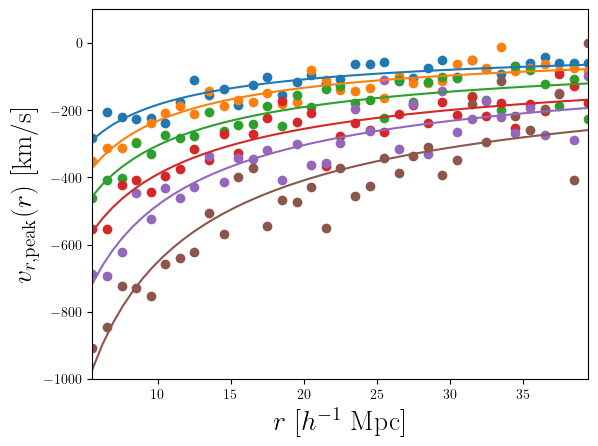

In [8]:
from scipy.interpolate import interp1d 

vr_pars = np.zeros((len(Mvirs), 2))
vr_errs = np.zeros((len(Mvirs), 2))


for k in range(len(Mvirs)):
    plt.scatter(rlos_cens, peak_vr_r[k], color=f'C{k}')

    p, c = curve_fit(plaw, rlos_cens/20, peak_vr_r[k])
    vr_pars[k] = p
    vr_errs[k] = np.sqrt(np.diag(c))

    rloss = np.linspace(rlos_cens.min(), rlos_cens.max())

    plt.plot(rloss, plaw(rloss/20, p[0], p[1]))

plt.ylim((-1000, 100))
plt.margins(x=0)
plt.ylabel(r"$v_{r, \rm peak}(r)$ [km/s]", fontsize=20)
plt.xlabel(r"$r \ [h^{-1}$ Mpc]", fontsize=20)

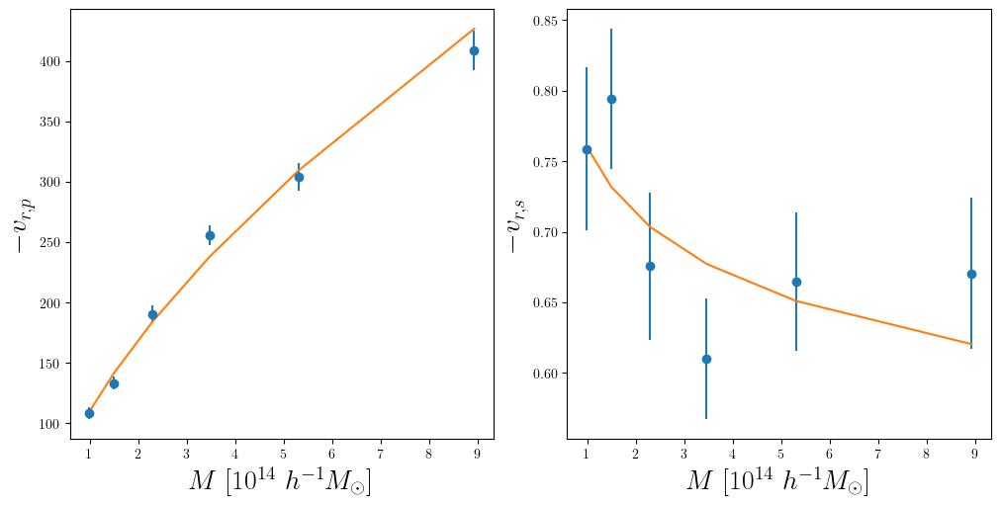

In [9]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5), layout='constrained')

vrm_pars = np.zeros((vr_pars.shape[-1], 2))

labels = [r"$v_{r, p}$", r"$v_{r, s}$"]

for i in range(vr_pars.shape[-1]):

    p, c = curve_fit(plaw, Mvirs/1e14, -vr_pars[:, i], sigma=vr_errs[:, i])
    vrm_pars[i] = p 

    ax[i].errorbar(Mvirs/1e14, -vr_pars[:, i], vr_errs[:, i], fmt='o')
    ax[i].plot(Mvirs/1e14, plaw(Mvirs/1e14, p[0], p[1]))
    ax[i].set_xlabel(r"$M \ [10^{14} \ h^{-1} M_\odot]$",  fontsize=20)
    ax[i].set_ylabel(r"$-$"+labels[i], fontsize=20)

In [64]:
def skewed_t_pdf(x, xi, omega, alpha, nu):
    """
    Azzalini & Capitanio skewed t-distribution PDF
    
    Parameters:
    xi: location parameter
    omega: scale parameter (> 0)
    alpha: skewness parameter
    nu: degrees of freedom (> 0)
    """
    # Standardize
    z = (x - xi) / omega
    
    # Student's t PDF
    t_pdf = t.pdf(z, df=nu)
    
    # Student's t CDF with modified argument
    t_cdf = t.cdf(alpha * z * np.sqrt((nu + 1) / (nu + z**2)), df=nu + 1)
    
    # Skewed t PDF
    pdf = (2 / omega) * t_pdf * t_cdf
    
    return pdf

def P_R_rlos_ind(vlos, R, rlos, M, pars):
    vrpp, vrps, vrsp, vrss, sigma, alpha = pars

    M_p = 1e14 # h^-1 M_sun
    r_p = 20 # h^-1 Mpc
    r = np.sqrt( R**2 + rlos**2 )
    theta = np.arctan2(rlos, R)
    sin = np.sin(theta)

    vrp = -plaw(M/M_p, vrpp, vrps)
    vrs = -plaw(M/M_p, vrsp, vrss)

    peak_vr = plaw(r/r_p, vrp, vrs)

    mean = peak_vr * sin + a*H*rlos/h

    dist = skewed_t_pdf(vlos, xi = mean, omega=sigma, alpha=-np.sign(rlos)*alpha, nu=4)

    return dist

def P_R_ind(vlos, R, M, pars):

    rho_g = 0.014  # h^3 Mpc^-3 mean galaxy number density in MDPL2

    # rlos integration range
    rlos_max = 60
    rlos_edges = np.linspace(-rlos_max, rlos_max, 100+1)
    rlos_cens = 0.5 * (rlos_edges[1:] + rlos_edges[:-1])

    r3d = np.sqrt(R**2 + rlos_cens**2)
    weight = rho_g * (cf_inf(r3d, M, jocond.myconfig.cf_pars) + 1)  

    Pvlos_grid = np.array(
        [P_R_rlos_ind(vlos, R, rlos, M, pars) for rlos in rlos_cens]
    )

    integrand = Pvlos_grid.T * weight[None, :] 

    P_out = simpson(integrand, x=rlos_cens, axis=1)

    return P_out / simpson(P_out, x=vlos) #/ np.sum(P_out * np.diff(vlos)[0])

In [65]:
# fit individual bins of R

PvR_pars = np.zeros((len(Mvirs), len(r_cens), 2))
PvR_errs = np.zeros(PvR_pars.shape)

vedges = np.linspace(-2500, 2500, 100+1)
vcens = 0.5*(vedges[1:] + vedges[:-1])

Nv_R = np.zeros((len(Mvirs), len(r_cens), len(vcens)))

for k in range(len(Mvirs)):
    for i in range(len(r_cens)):
        index = i + k*len(r_cens)

        nhist, bins = np.histogram(vphyslos[index], bins=vedges, density=False)
        Nv_R[k, i] = nhist

        hist, bins = np.histogram(vphyslos[index], bins=vedges, density=True)

        p, c = curve_fit( lambda v, s, al: P_R_ind(v, r_cens[i], Mvirs[k],  pars=[vrm_pars[0, 0], vrm_pars[0, 1], vrm_pars[1, 0], vrm_pars[1, 1], s, al] ), vcens,  hist, bounds=((0, 0), ( 1000, 5)), p0=[500, 1], method='trf' )
        
        PvR_pars[k, i] = p
        PvR_errs[k, i] = np.sqrt(np.diag(c))

Text(0.5, 0, '$R$')

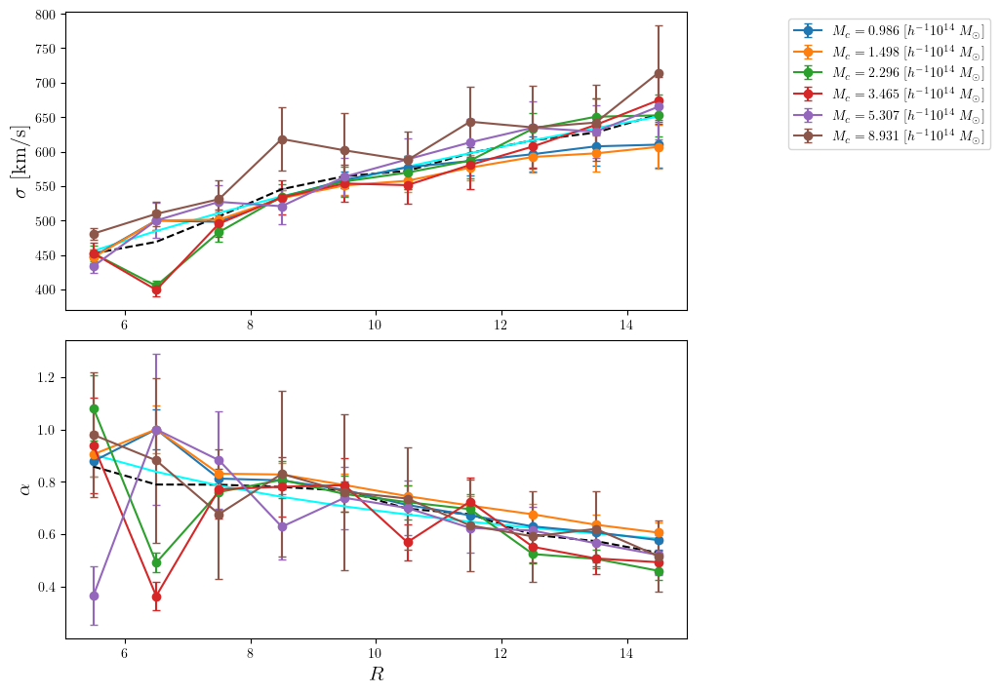

In [66]:
fig, ax = plt.subplots(2, 1, figsize=(10, 7), layout='constrained')

#names = [r"$\lambda$", r"$\sigma$ [km/s]", r"$\alpha$", r"dof"]
names = [r"$\sigma$ [km/s]", r"$\alpha$"]

PvR_means = np.zeros((len(r_cens), 2))

R_pars = np.zeros((2, 2))


for j in range(2):
    for k in range(len(Mvirs)):
        ax[j].errorbar(r_cens, PvR_pars[k, :, j], PvR_errs[k, :, j], fmt='o-', c=f"C{k}", capsize=3,  label=rf"$M_c = {(Mvirs[k]/1e14):.3f} \ [h^{{-1}} 10^{{14}} \ M_\odot]$")
    
    ax[j].plot(r_cens, np.mean(PvR_pars[:, :, j], axis=0), c='k', ls='--')
    
    PvR_means[:, j] = np.mean(PvR_pars[:, :, j], axis=0)

    mask = (r_cens != r_cens[1])
    
    p, c = curve_fit(plaw, r_cens[mask]/10, np.mean(PvR_pars[:, :, j], axis=0)[mask])

    R_pars[j] = p

    ax[j].plot(r_cens, plaw(r_cens/10, p[0], p[1]), c='cyan')

    ax[j].set_ylabel(names[j], fontsize=15)

ax[0].legend(loc='upper right', bbox_to_anchor=(1.5, 1))
ax[-1].set_xlabel(r"$R$", fontsize=15)

In [67]:
# fit all bins simultaneously
from jocond.likelihoods import *

p_init = np.concatenate((vrm_pars.flatten(), R_pars.flatten()))

def P_R_rlos(vlos, R, rlos, M, pars):
    vrpp, vrps, vrsp, vrss, sigma_p, sigma_s, alpha_p, alpha_s = pars

    M_p = 1e14 # h^-1 M_sun
    r_p = 20 # h^-1 Mpc
    R_p = 10 # h^-1 Mpc
    r = np.sqrt( R**2 + rlos**2 )
    theta = np.arctan2(rlos, R)
    sin = np.sin(theta)

    vrp = -plaw(M/M_p, vrpp, vrps)
    vrs = -plaw(M/M_p, vrsp, vrss)

    sigma = plaw(R/R_p, sigma_p, sigma_s)
    alpha = plaw(R/R_p, alpha_p, alpha_s)

    peak_vr = plaw(r/r_p, vrp, vrs)

    mean = peak_vr * sin + a*H*rlos/h

    dist = skewed_t_pdf(vlos, xi = mean, omega=sigma, alpha=-np.sign(rlos)*alpha, nu=4)

    return dist

def P_R(vlos, R, M, pars):

    rho_g = 0.014  # h^3 Mpc^-3 mean galaxy number density in MDPL2

    # rlos integration range
    rlos_max = 60
    rlos_edges = np.linspace(-rlos_max, rlos_max, 100+1)
    rlos_cens = 0.5 * (rlos_edges[1:] + rlos_edges[:-1])

    r3d = np.sqrt(R**2 + rlos_cens**2)
    weight = rho_g * (cf_inf(r3d, M, jocond.myconfig.cf_pars) + 1)  

    Pvlos_grid = np.array(
        [P_R_rlos(vlos, R, rlos, M, pars) for rlos in rlos_cens]
    )

    integrand = Pvlos_grid.T * weight[None, :] 

    P_out = simpson(integrand, x=rlos_cens, axis=1)

    return P_out / simpson(P_out, x=vlos) #/ np.sum(P_out * np.diff(vlos)[0])

In [74]:
def poisson_llh(pars):
    N = np.sum(Nv_R[:, :, :], axis=-1)[np.newaxis, np.newaxis, :] #Num of gals in distribution in r+M
    P = np.array([P_R(vcens, R, M, pars) for R in r_cens for M in Mvirs]) # ~5 sec / eval. 
    n = Nv_R # Num of gals in vel bin
    dv = np.diff(vcens)[0]

    lam = P*dv*N 
    log_likelihood = np.sum(scipy.stats.poisson.logpmf(k=n, mu=lam)) 
    
    return log_likelihood 

def P_R_rlos_vec(vlos, R, rlos, M, pars):
    """
    vlos:  (Nv,)
    R:     (NR,)
    rlos:  (Nrlos,)
    M:     (NM,)
    returns: (Nv, NR, NM, Nrlos)
    """
    vrpp, vrps, vrsp, vrss, sigma_p, sigma_s, alpha_p, alpha_s = pars
    M_p = 1e14
    r_p = 20
    R_p = 10

    # Reshape for broadcasting: (1, NR, 1, Nrlos)
    R_    = R[None, :, None, None]
    rlos_ = rlos[None, None, None, :]
    M_    = M[None, None, :, None]
    vlos_ = vlos[:, None, None, None]

    r     = np.sqrt(R_**2 + rlos_**2)
    theta = np.arctan2(rlos_, R_)
    sin   = np.sin(theta)

    vrp   = -plaw(M_ / M_p, vrpp, vrps)
    vrs   = -plaw(M_ / M_p, vrsp, vrss)
    sigma = plaw(R_ / R_p, sigma_p, sigma_s)
    alpha = plaw(R_ / R_p, alpha_p, alpha_s)

    peak_vr = plaw(r / r_p, vrp, vrs)
    mean    = peak_vr * sin + a * H * rlos_ / h

    dist = skewed_t_pdf(vlos_, xi=mean, omega=sigma,
                        alpha=-np.sign(rlos_) * alpha, nu=4)
    return dist  # (Nv, NR, NM, Nrlos)


def P_R_vec(vlos, R, M, pars):
    """
    vlos: (Nv,)
    R:    (NR,)
    M:    (NM,)
    returns: (Nv, NR, NM)
    """
    rho_g    = 0.014
    rlos_max = 60
    rlos_edges = np.linspace(-rlos_max, rlos_max, 101)
    rlos_cens  = 0.5 * (rlos_edges[1:] + rlos_edges[:-1])  # (Nrlos,)

    # r3d broadcast: (NR, Nrlos)
    r3d    = np.sqrt(R[:, None]**2 + rlos_cens[None, :]**2)
    # weight: (NR, NM, Nrlos)  — one weight per (R, M, rlos) triple
    weight = rho_g * (cf_inf(r3d[:, None, :], M[None, :, None],
                             jocond.myconfig.cf_pars) + 1)

    # (Nv, NR, NM, Nrlos)
    Pvlos_grid = P_R_rlos_vec(vlos, R, rlos_cens, M, pars)

    # integrand: (Nv, NR, NM, Nrlos)
    integrand = Pvlos_grid * weight[None, :, :, :]

    # integrate over rlos axis → (Nv, NR, NM)
    P_out = simpson(integrand, x=rlos_cens, axis=-1)

    # normalise over vlos axis (axis=0)
    dv = np.diff(vlos)[0]
    return P_out /simpson(P_out, x=vlos, axis=0) #/ np.sum(P_out * dv, axis=0, keepdims=True)


def poisson_llh_vec(pars):
    """
    Nv_R shape assumed: (Nv, NR, NM)
    """
    # (Nv, NR, NM)
    P   = P_R_vec(vcens, r_cens, Mvirs, pars) # < 1 sec / eval
    dv  = np.diff(vcens)[0]
    # total counts per (R, M): (1, NR, NM)
    N   = Nv_R.sum(axis=-1, keepdims=True)
    #print(P.shape, N.shape, dv.shape)
    lam = P.T * dv * N
    log_likelihood = np.sum(scipy.stats.poisson.logpmf(k=Nv_R, mu=lam))
    return log_likelihood

In [71]:
clive_init = np.concatenate((vrm_pars.flatten(), R_pars.flatten()))

In [72]:
Bounds = [(np.min((0, np.sign(par)*np.inf)), np.max((0, np.sign(par)*np.inf))) for par in clive_init]


In [75]:
# MLE 
res = scipy.optimize.minimize(lambda p: -poisson_llh_vec(p), clive_init, bounds=Bounds, method='nelder-mead')
print("Initial: ", p_init) 
print("MLE: ", res.x)


Initial:  [ 1.10271764e+02  6.17810211e-01  7.59902171e-01 -9.25929884e-02
  5.67822759e+02  3.67195468e-01  6.89410374e-01 -4.52537338e-01]
MLE:  [ 3.91964485e+02  1.58450665e-01  6.98921426e-02 -8.56163405e-02
  3.90759345e+02  9.23923791e-02  1.97691654e-02 -1.96400645e+00]


In [16]:
res = np.array([ 4.01208354e+02,  1.47953458e-01,  9.33753829e-02, -1.54321372e-02,
                 3.84235404e+02,  7.35258475e-02, -1.55291867e-02,  7.79715649e-01])

In [ ]:
res2 = [ 3.82802315e+02  1.75229207e-01  1.65740242e-01 -2.04169646e-01
  3.97300347e+02  1.01321301e-01  1.00947202e-04 -2.38455314e+00]

In [170]:
clive_init

array([ 1.10271764e+02,  6.17810211e-01,  7.59902171e-01, -9.25929884e-02,
        5.67728617e+02,  3.64409047e-01,  7.05232031e-01, -4.75770584e-01])

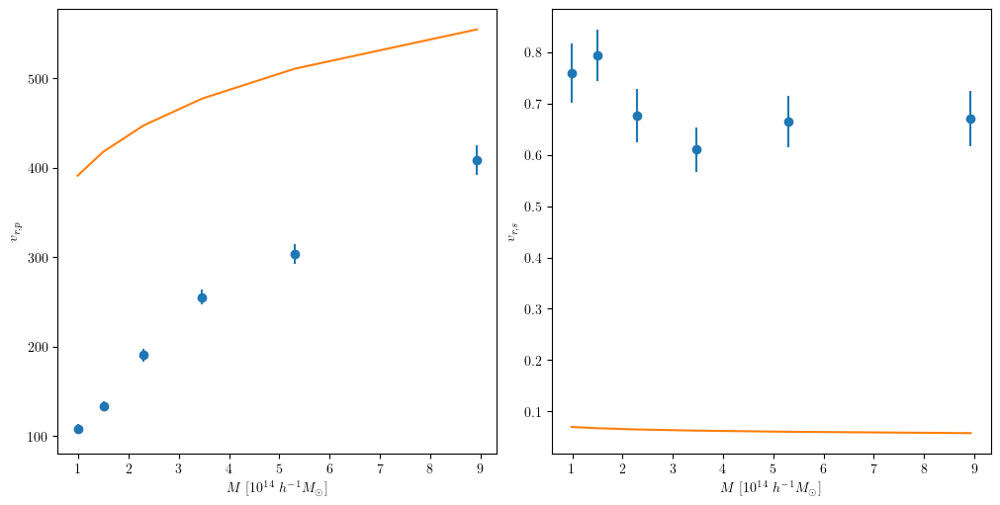

In [76]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5), layout='constrained')

MLE_vr = [[res.x[0], res.x[1]], [res.x[2], res.x[3]]]

labels = [r"$v_{r, p}$", r"$v_{r, s}$"]

for i in range(vr_pars.shape[-1]):

    ax[i].errorbar(Mvirs/1e14, -vr_pars[:, i], vr_errs[:, i], fmt='o')
    ax[i].plot(Mvirs/1e14, plaw(Mvirs/1e14, MLE_vr[i][0], MLE_vr[i][1]))
    ax[i].set_xlabel(r"$M \ [10^{14} \ h^{-1} M_\odot]$")
    ax[i].set_ylabel(labels[i])

Text(0.5, 0, '$R$')

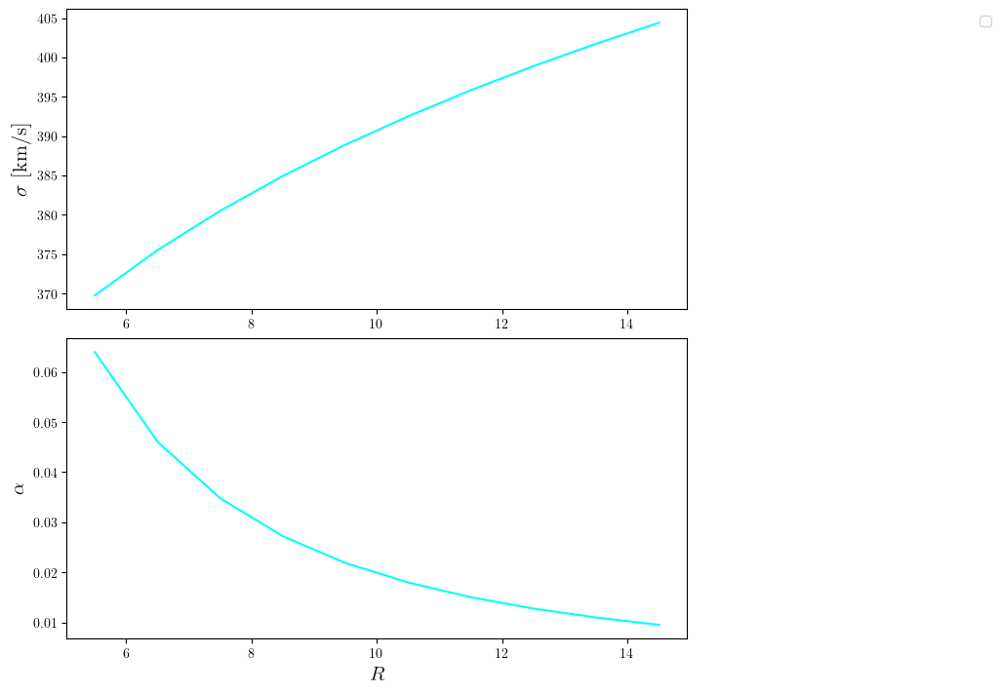

In [77]:
fig, ax = plt.subplots(2, 1, figsize=(10, 7), layout='constrained')

#names = [r"$\lambda$", r"$\sigma$ [km/s]", r"$\alpha$", r"dof"]
names = [r"$\sigma$ [km/s]", r"$\alpha$"]

MLE_sal = [[res.x[4], res.x[5]], [res.x[6], res.x[7]]]


for j in range(2):
    #for k in range(len(Mvirs)):
    #    ax[j].errorbar(r_cens, PvR_pars[k, :, j], PvR_errs[k, :, j], fmt='o-', c=f"C{k}", capsize=3,  label=rf"$M_c = {(Mvirs[k]/1e14):.3f} \ [h^{{-1}} 10^{{14}} \ M_\odot]$")
    
    #ax[j].plot(r_cens, np.mean(PvR_pars[:, :, j], axis=0), c='k', ls='--')
    

    ax[j].plot(r_cens, plaw(r_cens/10, MLE_sal[j][0], MLE_sal[j][1]), c='cyan')

    ax[j].set_ylabel(names[j], fontsize=15)

ax[0].legend(loc='upper right', bbox_to_anchor=(1.5, 1))
ax[-1].set_xlabel(r"$R$", fontsize=15)

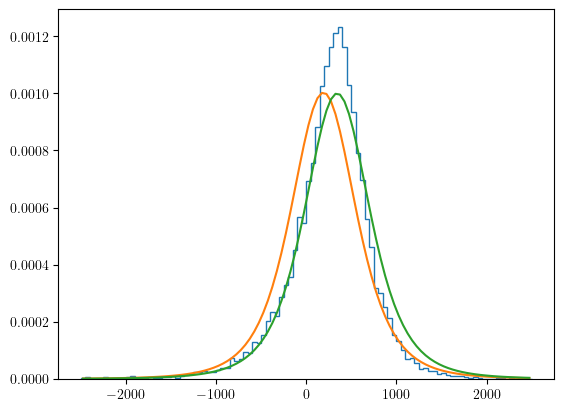

In [206]:
# what does BF P_R_rlos look like? 

test_vlos = vphyslos1[0]

th = plt.hist(test_vlos, bins=vedges, histtype='step', density=True)
plt.plot(vcens, P_R_rlos(vcens, r_cens[0], rlos_cens[0], Mvirs[0], res.x))
plt.plot(vcens, skewed_t_pdf(vcens, a*H*rlos_cens[0], 375, 0, 4))

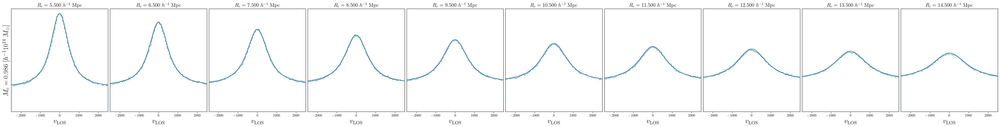

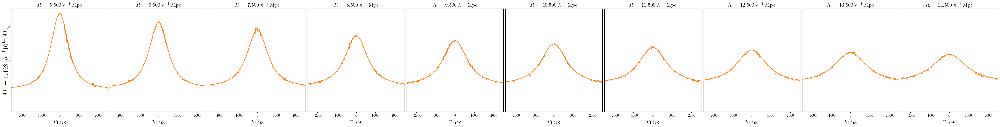

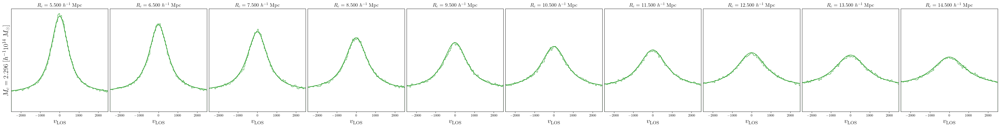

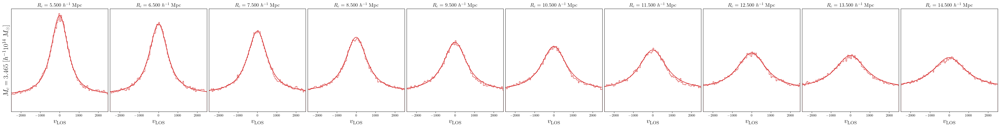

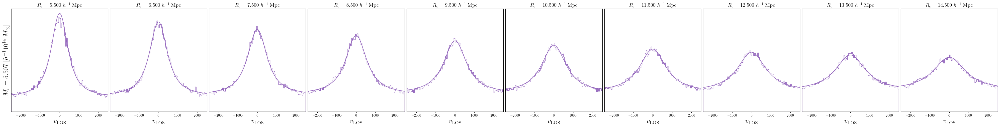

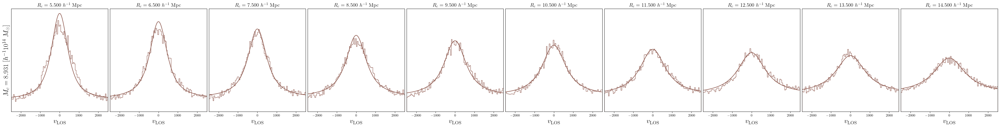

In [78]:
P = P_R_vec(vcens, r_cens, Mvirs, res.x)

for k in range(len(Mvirs)):
    fig, ax = plt.subplots(1, len(r_cens), figsize=(40, 5), layout='constrained', sharex=True, sharey=True)
    for i in range(len(r_cens)):
        index = i + k*len(r_cens)

        hist, bins, _ = ax[i].hist(vphyslos[index], bins=vedges, density=True, histtype='step', color=f'C{k}')

        ax[i].plot(vcens, P[:, i, k], c=f'C{k}') 
        ax[i].set_xlabel(r"$v_{\rm LOS}$", fontsize=20)
        ax[i].set_title(rf"$R_c = {r_cens[i]:.3f} \ h^{{-1}}$ Mpc", fontsize=15)
        ax[i].set_yticks([])
        ax[i].margins(x=0)
    ax[0].set_ylabel(rf"$M_c = {(Mvirs[k]/1e14):.3f} \ [h^{{-1}} 10^{{14}} \ M_\odot]$", fontsize=20)

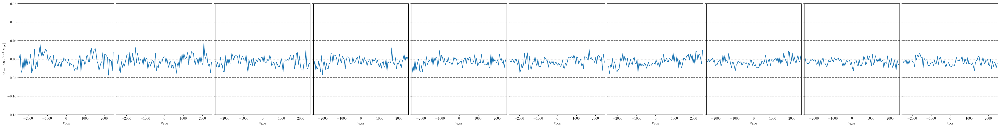

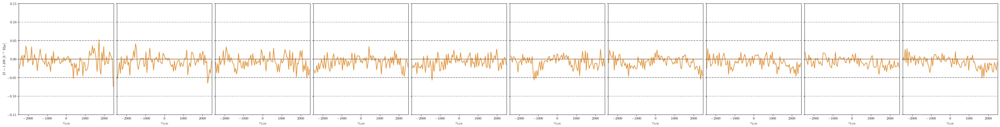

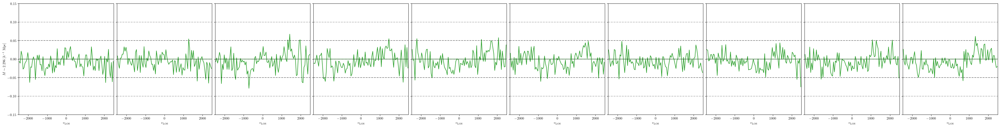

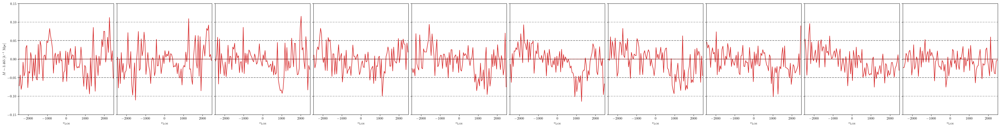

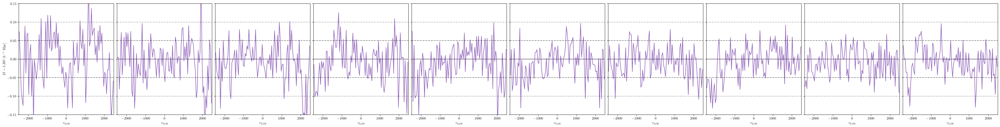

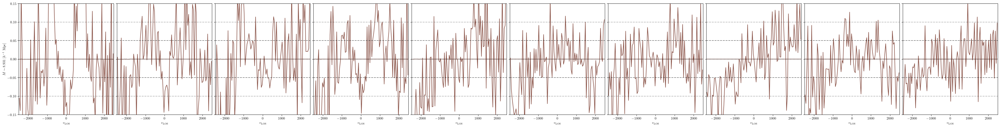

In [79]:
for k in range(len(Mvirs)):
    fig, ax = plt.subplots(1, len(r_cens), figsize=(40, 5), layout='constrained', sharex=True, sharey=True)
    for i in range(len(r_cens)):
        index = i + k*len(r_cens)

        hist, bins, _ = ax[i].hist(vphyslos[index], bins=vedges, density=True, histtype='step', color=f'C{k}')
        model = P[:, i, k]

        ax[i].plot(vcens, (hist-model)/model, c=f'C{k}') 
        ax[i].axhline(0, ls=':', color='k')
        ax[i].axhline(0.05, ls='--', color='k', alpha=0.5)
        ax[i].axhline(-0.05, ls='--', color='k', alpha=0.5)
        ax[i].axhline(0.1, ls='--', color='k', alpha=0.3)
        ax[i].axhline(-0.1, ls='--', color='k', alpha=0.3)

        ax[i].set_xlabel(r"$v_{\rm LOS}$")
        #ax[i].set_yticks([])
        ax[i].set_ylim((-0.15, 0.15))
        ax[i].margins(x=0)
    ax[0].set_ylabel(rf"$M\sim {(Mvirs[k]/1e14):.3f} \ [h^{{-1}}$ Mpc]")

In [80]:
clive_init = np.concatenate((vrm_pars.flatten(), R_pars.flatten()))

In [81]:
def RG_llh_ind(pars, data, r_ind):
    M, s = pars 

    M_p = 1e14

    dv = (vedges[-1]-vedges[0])/(len(vedges)-1)

    N_avg = np.sum(data) * P_R(vcens, r_cens[r_ind], M*M_p, res.x) * dv

    sigmasq = N_avg + s**2 * N_avg**2

    chisq = ((data) - N_avg)**2 / sigmasq  

    return - 0.5 * np.sum(chisq + np.log(sigmasq))

def G_llh_ind(pars, data, r_ind):
    M = pars 

    M_p = 1e14

    dv = (vedges[-1]-vedges[0])/(len(vedges)-1)

    N_avg = np.sum(data) * P_R(vcens, r_cens[r_ind], M*M_p, res.x) * dv

    sigmasq = N_avg 

    chisq = ((data) - N_avg)**2 / sigmasq  

    return - 0.5 * np.sum(chisq + np.log(sigmasq))

In [44]:
# MLE 
soln = scipy.optimize.minimize(lambda p: -RG_llh_ind(p, Nv_R[0, 0], 0), [Mvirs[0]/1e14, 0.01], method='L-BFGS-B')
print("Initial: ", [Mvirs[0]/1e14, 0.01]) 
print("MLE: ", soln.x)

Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.97384041 0.00898677]


In [29]:
# individual bins
sim_pars = np.zeros((len(Mvirs), len(r_cens), 2))
#errs = np.zeros((len(Mvirs), len(r_cens), 2))


for k in range(len(Mvirs)):
    for i in range(len(r_cens)):
        p_init = [Mvirs[k]/1e14, 0.01]

        soln = scipy.optimize.minimize(lambda p: -RG_llh_ind(p, Nv_R[k, i], i), p_init, 
                                    #bounds = [(0.5, 12), (-0.1, 0.1)],#, (0, np.inf), (0, np.inf)], 
                                    method='nelder-mead', 
                                    )
        print("Initial: ",p_init) 
        print("MLE: ", soln.x) 
        print(soln.message)

        sim_pars[k, i] = soln.x

Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.9582138  0.00965081]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.95136021 0.00789855]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.99957916 0.00461106]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.00778881 0.00351368]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.01215511 0.00324476]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.94225964 0.00455013]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.94732075 0.00773493]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [ 9.05922034e-01 -4.75493202e-07]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [9.80143357e-01 4.64964865e-04]
Optimization terminated successfully.
I

(np.float64(0.8000202269281375), np.float64(16.000000000000007))

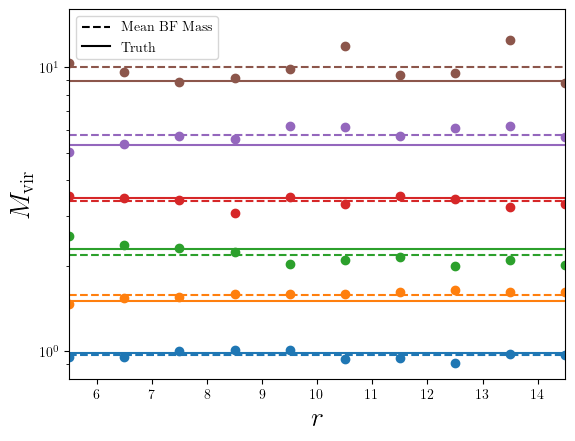

In [30]:
from matplotlib.lines import Line2D


for k in range(len(Mvirs)):
    plt.scatter(r_cens, sim_pars[k, :, 0])
    #plt.errorbar(r_cens, sim_pars[k, :, 0], np.sqrt(0.5*errs[k, :, 0]), fmt='o')
    plt.axhline(Mvirs[k]/1e14, c=f'C{str(k)}', ls='-')
    plt.axhline(np.mean(sim_pars[k, :, 0]), c=f'C{str(k)}', ls='--')

    #plt.axhline(mbins[k+1]/1e14, c=f'k', ls=':')



plt.xlabel(r'$R$', fontsize=20)
plt.ylabel(r'$M_{\rm MLE}$', fontsize=20)

marker_1 = Line2D(
    [0], [0],
    color='k',          
    marker='none',
    linestyle='--',
    label='Mean BF Mass', 

)

marker_2 = Line2D(
    [0], [0],
    color='k',          
    marker='none',
    linestyle='-',
    label='Truth'
)

plt.xlabel(r'$r$', fontsize=20)
plt.ylabel(r'$M_{\rm vir}$', fontsize=20)
plt.yscale('log')
plt.margins(x=0)
plt.legend(handles=[marker_1, marker_2], fontsize=10)
plt.ylim((mbins[0]/1e14, mbins[-1]/1e14))

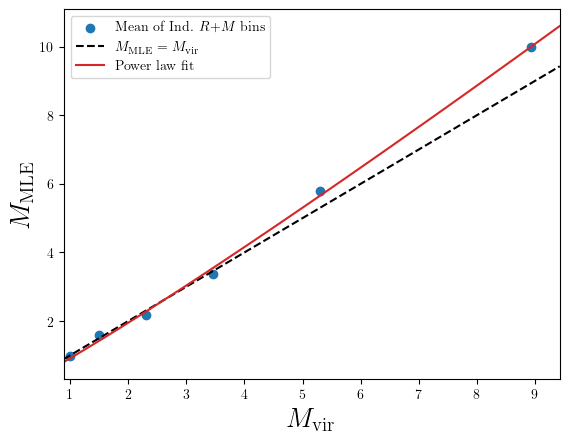

In [31]:
ms = np.linspace(Mvirs[0]/1e14-0.1, Mvirs[-1]/1e14+0.5, 100)

mvirs = Mvirs/1e14

p, c = curve_fit(plaw, mvirs, np.mean(sim_pars[:, :, 0], axis=-1))
plt.scatter(mvirs, np.mean(sim_pars[:, :, 0], axis=-1), label='Mean of Ind. $R$+$M$ bins')
plt.plot(ms, line(ms, 1, 0), c='k', ls='--', label=r'$M_{\rm MLE} = M_{\rm vir}$')
plt.plot(ms, plaw(ms, p[0], p[1]), c='C3', ls='-', label='Power law fit')
plt.margins(x=0)
plt.ylabel(r'$M_{\rm MLE}$', fontsize=20)
plt.xlabel(r'$M_{\rm vir}$', fontsize=20)
plt.legend(fontsize=10)

In [32]:
def var_diff(R, sp, a, s0):
    Rp = 15 #h^-1 Mpc, pivot scale
    return sp*(R/Rp)**(-a)+s0 

def plawc(x, a, b, c):
    return a*x**b+c

Text(0, 0.5, '$\\sigma_{\\rm inht}$')

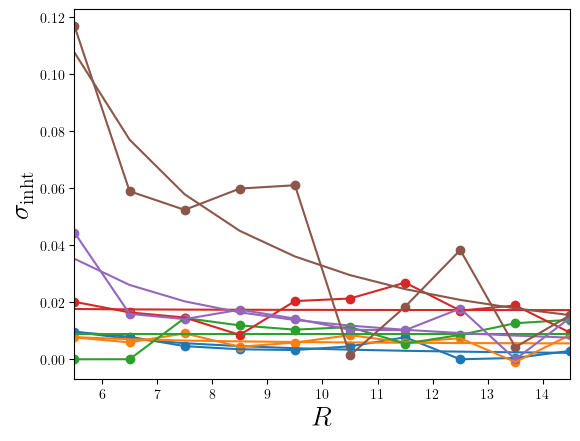

In [33]:
inht_pars = np.zeros((len(Mvirs), 2))
inht_errs = np.zeros((len(Mvirs), 2))

for k in range(6):
    plt.scatter(r_cens, sim_pars[k, :, 1], )
    plt.plot(r_cens, sim_pars[k, :, 1])
    #plt.errorbar(r_cens, sim_pars[k, :, 1], err_mass_ind_RG[k, :, 1], fmt='o')

    p, c = curve_fit(lambda x, a, c: plawc(x, a, b=-2, c=c), r_cens/10, sim_pars[k, :, 1],bounds=((0, 0), (10, 10)), maxfev=10_000)
    plt.plot(r_cens, plawc(r_cens/10, p[0], -2, p[1]), c=f'C{str(k)}')
    # p, c = curve_fit(var_diff, r_cens/10, sim_pars[k, :, 1], bounds=((0, 0, 0), (0.01, 2, 0.002)) , maxfev=10_000)
    # plt.plot(r_cens, var_diff(r_cens/10, p[0], p[1], p[2]), c=f'C{str(k)}')
    
    inht_pars[k, :] = p
    inht_errs[k, :] = np.sqrt(np.diag(c))

plt.margins(x=0)
#plt.ylim((0, 0.12))
plt.xlabel(r'$R$', fontsize=20)
plt.ylabel(r'$\sigma_{\rm inht}$', fontsize=20)

#marker_1 = Line2D([0], [0], color='k', marker='none', linestyle='-',  label=r'$A \ [\mathrm{var_diff}\left(\frac{r/r_p - m}{\sigma}\right)+1]$',)

#plt.legend(handles=[marker_1], fontsize=15) 

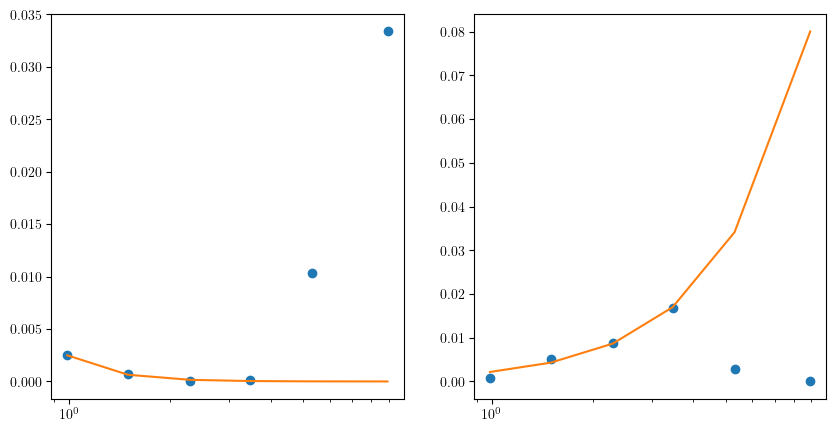

In [89]:
fig, ax = plt.subplots(1, inht_pars.shape[-1], figsize=(10, 5))

for j in range(inht_pars.shape[-1]):
    p, c = curve_fit(plaw, Mvirs[:4]/1e14, inht_pars[:4, j])
    ax[j].scatter(Mvirs/1e14, inht_pars[:, j])
    ax[j].plot(Mvirs/1e14, plaw(Mvirs/1e14, p[0], p[1]), c='C1')
    #ax[j].errorbar(Mvirs/1e14, inht_pars[:, j], inht_errs[:, j], fmt='o')
    ax[j].set_xscale('log')

5.9916987740649


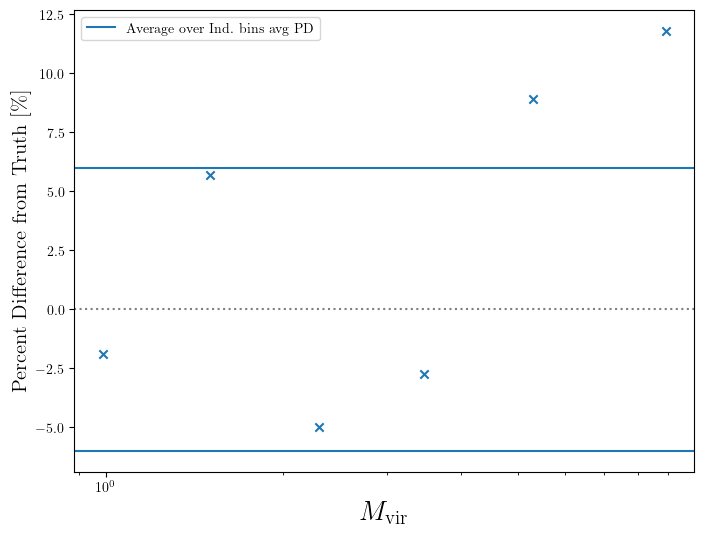

In [36]:
fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(mvirs, ((np.mean(sim_pars[:, :, 0], axis=1)-mvirs)/mvirs)*100, marker='x')
ax.axhline(np.mean(np.abs((np.mean(sim_pars[:, :, 0], axis=1)-mvirs)/mvirs))*100, label=r'Average over Ind. bins avg PD') 
ax.axhline(-np.mean(np.abs((np.mean(sim_pars[:, :, 0], axis=1)-mvirs)/mvirs))*100 ) 


ax.axhline(0.0, c='k', ls=':', alpha=0.5)
ax.set_xlabel(r"$M_{\rm vir}$", fontsize=20) 
ax.set_ylabel(r"Percent Difference from Truth $[\%]$", fontsize=15) 
ax.set_xscale('log')
#ax.set_ylim((-5, 5))
#ax.set_title(titles[j], fontsize=25)
ax.legend()

print(np.mean(np.abs((np.mean(sim_pars[:, :, 0], axis=1)-mvirs)/mvirs))*100)

5.9916987740649


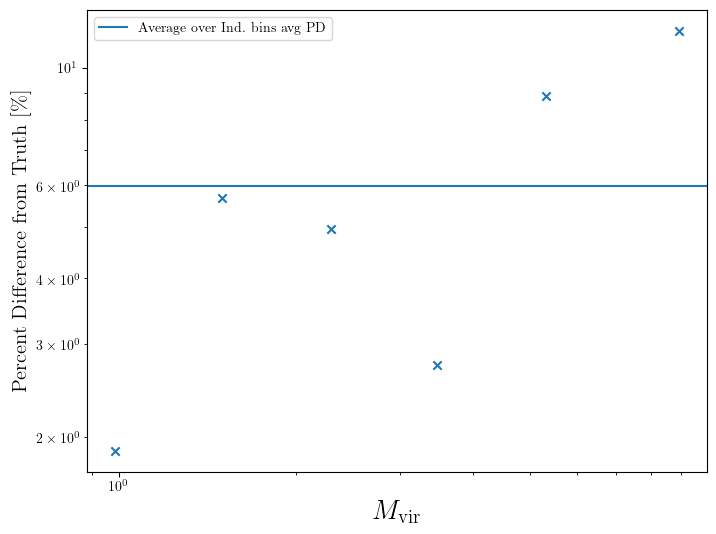

In [39]:
fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(mvirs, np.abs((np.mean(sim_pars[:, :, 0], axis=1)-mvirs)/mvirs)*100, marker='x')
ax.axhline(np.mean(np.abs((np.mean(sim_pars[:, :, 0], axis=1)-mvirs)/mvirs))*100, label=r'Average over Ind. bins avg PD') 


#ax.axhline(0.0, c='k', ls=':', alpha=0.5)
ax.set_xlabel(r"$M_{\rm vir}$", fontsize=20) 
ax.set_ylabel(r"Percent Difference from Truth $[\%]$", fontsize=15) 
ax.set_xscale('log')
ax.set_yscale('log')
#ax.set_ylim((-5, 5))
#ax.set_title(titles[j], fontsize=25)
ax.legend()

print(np.mean(np.abs((np.mean(sim_pars[:, :, 0], axis=1)-mvirs)/mvirs))*100)

In [102]:
def G_llh_sim(pars, data):
    M1, M2, M3, M4, M5, M6 = pars 

    Ms = np.array([M1, M2, M3, M4, M5, M6])

    M_p = 1e14

    dv = (vedges[-1]-vedges[0])/(len(vedges)-1)

    model = P_R_vec(vcens, r_cens, Ms*M_p, res).T

    N_avg = np.sum(data, axis=0) * model * dv 

    sigmasq = N_avg #+ s**2 * N_avg**2 

    chisq = ((data) - N_avg)**2 / sigmasq  

    return - 0.5 * np.sum(chisq + np.log(sigmasq)) 

In [103]:
# MLE over masses simultaneously
par_mass_sim = np.zeros(6)
err_mass_sim = np.zeros(6)
p_init = mvirs #np.append(mvirs, 0.02)

Bounds = [(mbins[i]/1e14, mbins[i+1]/1e14) for i in range(len(mvirs))]

soln = scipy.optimize.minimize(lambda p: -G_llh_sim(p, Nv_R), p_init, 
                            #bounds = Bounds, #[(0.5, 20.0), (0.5, 20.0), (0.5, 20.0), (0.5, 20.0), (0.5, 20.0), (0.5, 20.0)], #[(0.5, 20.0), (0, np.inf), (0, np.inf), (0, np.inf)], 
                            method='nelder-mead', 
                            options={'maxiter':10_000}
                            )

print("Initial: ",p_init) 
print("MLE: ", soln.x) 
print(soln.message)

par_mass_sim[i] = soln.x 

KeyboardInterrupt: 

In [ ]:
#TODO: compute model samples using BF clive model. 

In [82]:
def sample_P_R(R, M, pars, n_samples=1000, rlos_max=60, n_rlos=100, vlos_range=(-3000, 3000)):
    """
    Draw samples from P_R(vlos | R, M, pars) using importance sampling
    over the rlos marginalization.

    Parameters
    ----------
    R        : float, projected radius
    M        : float, halo mass
    pars     : model parameters
    n_samples: number of vlos samples to draw
    rlos_max : integration limit for rlos
    n_rlos   : number of rlos bins
    vlos_range: (min, max) range for vlos evaluation grid

    Returns
    -------
    samples : (n_samples,) array of vlos values
    """
    rho_g = 0.014

    # --- rlos grid (same as P_R) ---
    rlos_edges = np.linspace(-rlos_max, rlos_max, n_rlos + 1)
    rlos_cens  = 0.5 * (rlos_edges[1:] + rlos_edges[:-1])
    drlos      = rlos_edges[1] - rlos_edges[0]

    r3d    = np.sqrt(R**2 + rlos_cens**2)
    weight = rho_g * (cf_inf(r3d, M, jocond.myconfig.cf_pars) + 1)
    weight = weight / weight.sum()   # normalize to a probability over rlos slices

    # --- step 1: sample a rlos slice according to weight ---
    rlos_indices = np.random.choice(len(rlos_cens), size=n_samples, p=weight)
    rlos_sampled = rlos_cens[rlos_indices]

    # --- step 2: for each sampled rlos, draw one vlos from P_R_rlos ---
    # Build the conditional distribution on a fine vlos grid, then invert its CDF
    vlos_grid  = np.linspace(vlos_range[0], vlos_range[1], 2000)
    dvlos      = vlos_grid[1] - vlos_grid[0]

    samples = np.empty(n_samples)

    for i, rlos in enumerate(rlos_sampled):
        # evaluate the conditional pdf on the grid
        pdf  = P_R_rlos(vlos_grid, R, rlos, M, pars)
        pdf  = np.clip(pdf, 0, None)

        # normalize and build CDF
        pdf  = pdf / (pdf.sum() * dvlos)
        cdf  = np.cumsum(pdf) * dvlos
        cdf  = cdf / cdf[-1]           # ensure it reaches exactly 1

        # invert CDF via interpolation (quantile function)
        u         = np.random.uniform()
        samples[i] = np.interp(u, cdf, vlos_grid)

    return samples

def sample_P_R_fast(R, M, pars, n_samples=1000, rlos_max=60, n_rlos=100,
                    vlos_halfwidth=3000, n_vlos=2000):
    rho_g = 0.014
    rlos_edges = np.linspace(-rlos_max, rlos_max, n_rlos + 1)
    rlos_cens  = 0.5 * (rlos_edges[1:] + rlos_edges[:-1])

    r3d    = np.sqrt(R**2 + rlos_cens**2)
    weight = rho_g * (cf_inf(r3d, M, jocond.myconfig.cf_pars) + 1)
    weight = weight / weight.sum()

    rlos_indices = np.random.choice(len(rlos_cens), size=n_samples, p=weight)
    samples = np.empty(n_samples)

    for rlos_idx in np.unique(rlos_indices):
        mask = rlos_indices == rlos_idx
        rlos = rlos_cens[rlos_idx]

        # compute the expected mean for this rlos slice
        vrpp, vrps, vrsp, vrss, sigma_p, sigma_s, alpha_p, alpha_s = pars
        M_p = 1e14
        r_p = 20
        R_p = 10
        r       = np.sqrt(R**2 + rlos**2)
        theta   = np.arctan2(rlos, R)
        vrp     = -plaw(M / M_p, vrpp, vrps)
        vrs     = -plaw(M / M_p, vrsp, vrss)
        peak_vr = plaw(r / r_p, vrp, vrs)
        mean    = peak_vr * np.sin(theta) + a * H * rlos / h

        # build vlos grid centered on the mean for this slice
        vlos_grid = np.linspace(mean - vlos_halfwidth, mean + vlos_halfwidth, n_vlos)
        dvlos     = np.diff(vlos_grid)[0] #vlos_grid[1] - vlos_grid[0]

        pdf = P_R_rlos(vlos_grid, R, rlos, M, pars)
        pdf = np.clip(pdf, 0, None)

        # # sanity check: warn if the pdf is still being cut off
        # edge_threshold = 1e-4 * pdf.max()
        # if pdf[0] > edge_threshold or pdf[-1] > edge_threshold:
        #     import warnings
        #     warnings.warn(
        #         f"PDF at rlos={rlos:.1f} still clipped at edges "
        #         f"(left={pdf[0]:.3e}, right={pdf[-1]:.3e}, max={pdf.max():.3e}). "
        #         f"Consider increasing vlos_halfwidth."
        #     )

        pdf = pdf / (pdf.sum() * dvlos)
        cdf = np.cumsum(pdf) * dvlos
        cdf = cdf / cdf[-1]

        u = np.random.uniform(size=mask.sum())
        samples[mask] = np.interp(u, cdf, vlos_grid)

    return samples

In [154]:
# test 

test_hist = Nv_R[0, 9] #/ np.sum(Nv_R[0, 0] * np.diff(vcens)[0])

test_samp = sample_P_R_fast(r_cens[9], Mvirs[0], res, n_samples=int(np.sum(test_hist)), vlos_halfwidth=2500, n_vlos=len(vcens))

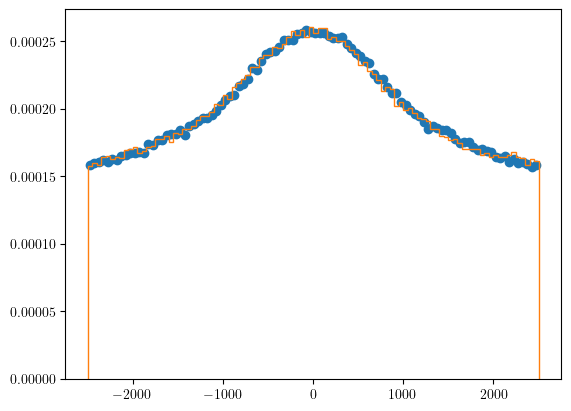

In [155]:
plt.scatter(vcens, test_hist/np.sum(test_hist * np.diff(vcens)[0]))
hist, _, _ = plt.hist(test_samp, bins=vedges, histtype='step', color='C1', density=True)

In [83]:
# compute model sample histograms

Nv_R_mod = np.zeros(Nv_R.shape)

for k in range(len(Mvirs)):
    for i in tqdm(range(len(r_cens))):
        N = int(np.sum(Nv_R[k, i]))

        model_samples = sample_P_R_fast(r_cens[i], Mvirs[k], res.x, N, vlos_halfwidth=2500, n_vlos=len(vcens))

        hist, _ = np.histogram(model_samples, bins=vedges, density=False)

        Nv_R_mod[k, i] = hist 

100%|██████████| 10/10 [00:00<00:00, 10.10it/s]


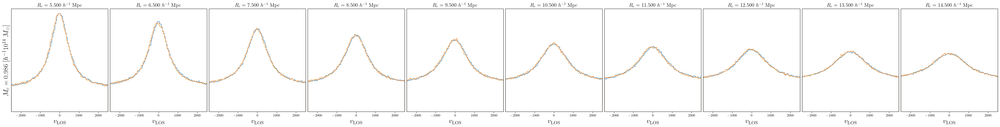

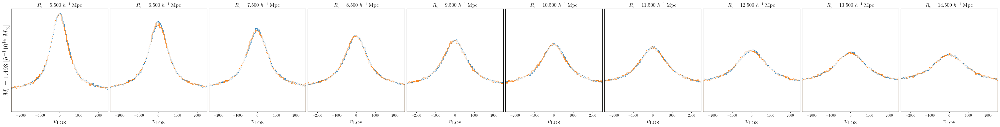

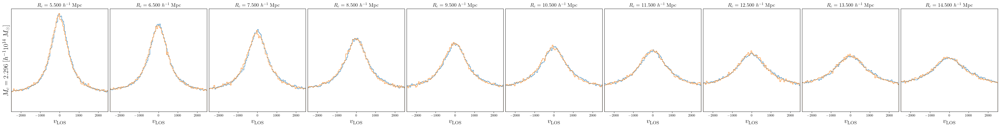

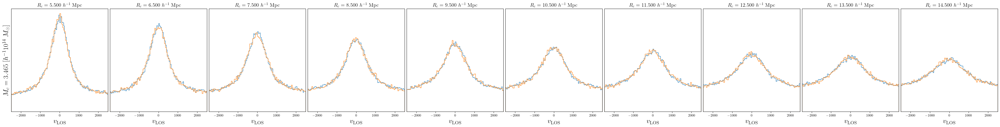

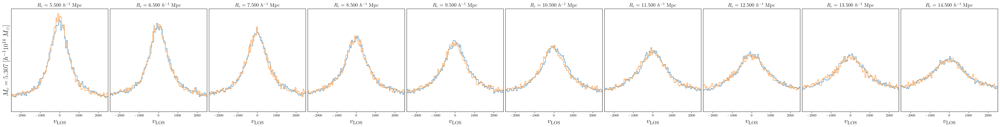

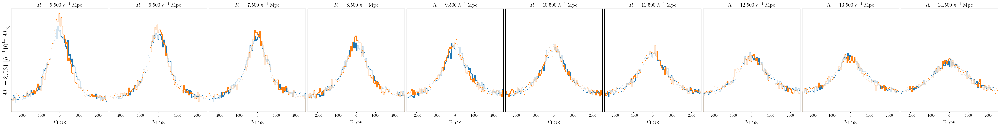

In [190]:
# check 

for k in range(len(Mvirs)):
    fig, ax = plt.subplots(1, len(r_cens), figsize=(40, 5), layout='constrained', sharex=True, sharey=True)
    for i in range(len(r_cens)):

        ax[i].hist(vcens, bins=vedges, weights=Nv_R[k, i], density=True, histtype='step')

        ax[i].hist(vcens, bins=vedges, weights=Nv_R_mod[k, i], density=True, histtype='step')

        ax[i].set_xlabel(r"$v_{\rm LOS}$", fontsize=20)
        ax[i].set_title(rf"$R_c = {r_cens[i]:.3f} \ h^{{-1}}$ Mpc", fontsize=15)
        ax[i].set_yticks([])
        ax[i].margins(x=0)
    ax[0].set_ylabel(rf"$M_c = {(Mvirs[k]/1e14):.3f} \ [h^{{-1}} 10^{{14}} \ M_\odot]$", fontsize=20)

In [84]:
# fit mass as before, now with histograms

pars = np.zeros((len(Mvirs), len(r_cens), 2))
#errs = np.zeros((len(Mvirs), len(r_cens), 2))


for k in range(len(Mvirs)):
    for i in range(len(r_cens)):
        p_init = [Mvirs[k]/1e14, 0.01]

        soln = scipy.optimize.minimize(lambda p: -RG_llh_ind(p, Nv_R_mod[k, i], i), p_init, 
                                    #bounds = [(0.5, 12), (-0.1, 0.1)],#, (0, np.inf), (0, np.inf)], 
                                    method='nelder-mead', 
                                    )
        print("Initial: ",p_init) 
        print("MLE: ", soln.x) 
        print(soln.message)

        pars[k, i] = soln.x

Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.01285756 0.01889955]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.02168014 0.0172943 ]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.04936255 0.01477744]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.99358565 0.01534858]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.02557719 0.01130713]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.98911245 0.01232264]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.04646623 0.0139079 ]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.02062383 0.01067887]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.02201256 0.01121964]
Optimization terminated successfully.
Initial:  [np.float

(np.float64(0.8000202269281375), np.float64(16.000000000000007))

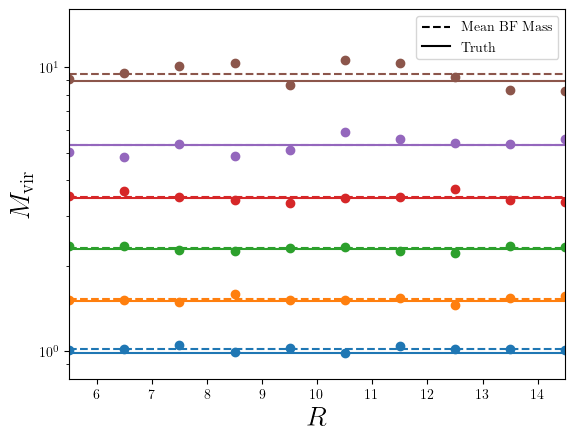

In [85]:
from matplotlib.lines import Line2D


for k in range(len(Mvirs)):
    plt.scatter(r_cens, pars[k, :, 0])
    #plt.errorbar(r_cens, pars[k, :, 0], np.sqrt(0.5*errs[k, :, 0]), fmt='o')
    plt.axhline(Mvirs[k]/1e14, c=f'C{str(k)}', ls='-')
    plt.axhline(np.mean(pars[k, :, 0]), c=f'C{str(k)}', ls='--')

    #plt.axhline(mbins[k+1]/1e14, c=f'k', ls=':')



plt.xlabel(r'$R$', fontsize=20)
plt.ylabel(r'$M_{\rm MLE}$', fontsize=20)

marker_1 = Line2D(
    [0], [0],
    color='k',          
    marker='none',
    linestyle='--',
    label='Mean BF Mass', 

)

marker_2 = Line2D(
    [0], [0],
    color='k',          
    marker='none',
    linestyle='-',
    label='Truth'
)

plt.xlabel(r'$R$', fontsize=20)
plt.ylabel(r'$M_{\rm vir}$', fontsize=20)
plt.yscale('log')
plt.margins(x=0)
plt.legend(handles=[marker_1, marker_2], fontsize=10)
plt.ylim((mbins[0]/1e14, mbins[-1]/1e14))

Text(0, 0.5, '$\\sigma_{\\rm inht}$')

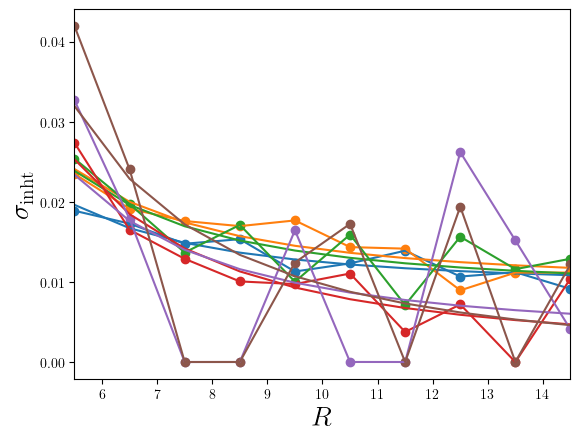

In [86]:
inht_pars = np.zeros((len(Mvirs), 2))
inht_errs = np.zeros((len(Mvirs), 2))

for k in range(6):
    plt.scatter(r_cens, pars[k, :, 1], )
    plt.plot(r_cens, pars[k, :, 1])
    #plt.errorbar(r_cens, pars[k, :, 1], err_mass_ind_RG[k, :, 1], fmt='o')

    p, c = curve_fit(lambda x, a, c: plawc(x, a, b=-2, c=c), r_cens/10, pars[k, :, 1],bounds=((0, 0), (10, 10)), maxfev=10_000)
    plt.plot(r_cens, plawc(r_cens/10, p[0], -2, p[1]), c=f'C{str(k)}')
    # p, c = curve_fit(var_diff, r_cens/10, pars[k, :, 1], bounds=((0, 0, 0), (0.01, 2, 0.002)) , maxfev=10_000)
    # plt.plot(r_cens, var_diff(r_cens/10, p[0], p[1], p[2]), c=f'C{str(k)}')
    
    inht_pars[k, :] = p
    inht_errs[k, :] = np.sqrt(np.diag(c))

plt.margins(x=0)
#plt.ylim((0, 0.12))
plt.xlabel(r'$R$', fontsize=20)
plt.ylabel(r'$\sigma_{\rm inht}$', fontsize=20)

#marker_1 = Line2D([0], [0], color='k', marker='none', linestyle='-',  label=r'$A \ [\mathrm{var_diff}\left(\frac{r/r_p - m}{\sigma}\right)+1]$',)

#plt.legend(handles=[marker_1], fontsize=15) 

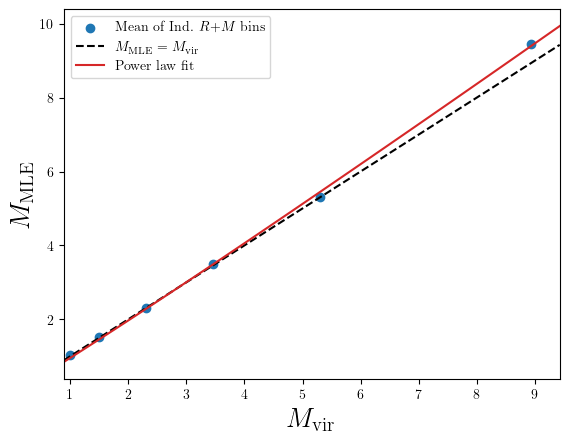

In [87]:
ms = np.linspace(Mvirs[0]/1e14-0.1, Mvirs[-1]/1e14+0.5, 100)

mvirs = Mvirs/1e14

p, c = curve_fit(plaw, mvirs, np.mean(pars[:, :, 0], axis=-1))
plt.scatter(mvirs, np.mean(pars[:, :, 0], axis=-1), label='Mean of Ind. $R$+$M$ bins')
plt.plot(ms, line(ms, 1, 0), c='k', ls='--', label=r'$M_{\rm MLE} = M_{\rm vir}$')
plt.plot(ms, plaw(ms, p[0], p[1]), c='C3', ls='-', label='Power law fit')
plt.margins(x=0)
plt.ylabel(r'$M_{\rm MLE}$', fontsize=20)
plt.xlabel(r'$M_{\rm vir}$', fontsize=20)
plt.legend(fontsize=10)

1.9801479505916437


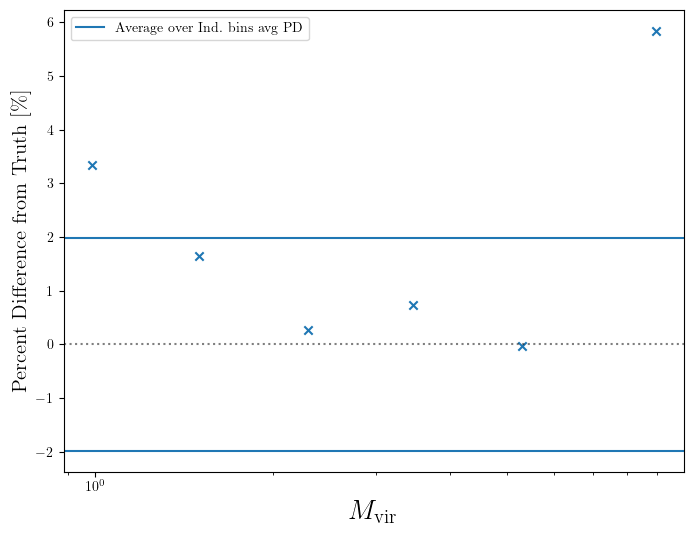

In [88]:
fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(mvirs, ((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs)*100, marker='x')
ax.axhline(np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100, label=r'Average over Ind. bins avg PD') 
ax.axhline(-np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100 ) 


ax.axhline(0.0, c='k', ls=':', alpha=0.5)
ax.set_xlabel(r"$M_{\rm vir}$", fontsize=20) 
ax.set_ylabel(r"Percent Difference from Truth $[\%]$", fontsize=15) 
ax.set_xscale('log')
#ax.set_ylim((-5, 5))
#ax.set_title(titles[j], fontsize=25)
ax.legend()
print(np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100)

1.126099873122092


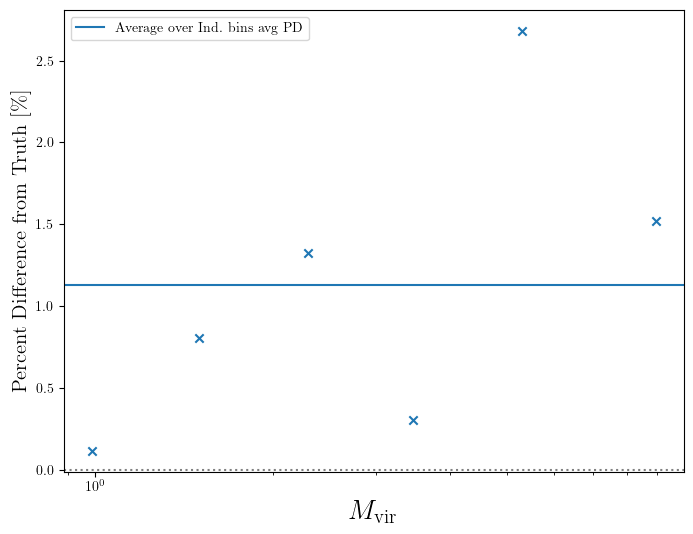

In [41]:
fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(mvirs, np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs)*100, marker='x')
ax.axhline(np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100, label=r'Average over Ind. bins avg PD') 


ax.axhline(0.0, c='k', ls=':', alpha=0.5)
ax.set_xlabel(r"$M_{\rm vir}$", fontsize=20) 
ax.set_ylabel(r"Percent Difference from Truth $[\%]$", fontsize=15) 
ax.set_xscale('log')
#ax.set_ylim((-5, 5))
#ax.set_title(titles[j], fontsize=25)
ax.legend()
print(np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100)

Min MAPD:  in
Min MAPD:  in
Min MAPD:  in
Min MAPD:  out
Min MAPD:  out
Min MAPD:  out
Min MAPD:  out
Min MAPD:  in
Min MAPD:  in
Min MAPD:  in
Min MAPD:  in
Min MAPD:  in
Min MAPD:  out
Min MAPD:  out
Min MAPD:  out
Min MAPD:  out
Min MAPD:  out
Min MAPD:  out
Min MAPD:  in
Min MAPD:  out
Min MAPD:  out
Min MAPD:  in
Min MAPD:  in
Min MAPD:  out
Min MAPD:  in
Min MAPD:  out
Min MAPD:  out
Min MAPD:  in
Min MAPD:  in
Min MAPD:  out
Min MAPD:  out
Min MAPD:  in
Min MAPD:  in
Min MAPD:  in
Min MAPD:  in
Min MAPD:  in
Min MAPD:  in
Min MAPD:  out
Min MAPD:  out
Min MAPD:  in
Min MAPD:  in
Min MAPD:  out
Min MAPD:  out
Min MAPD:  in
Min MAPD:  in
Min MAPD:  out
Min MAPD:  in
Min MAPD:  in
Min MAPD:  in
Min MAPD:  in
Min MAPD:  out
Min MAPD:  in
Min MAPD:  out
Min MAPD:  in
Min MAPD:  out
Min MAPD:  out
Min MAPD:  out
Min MAPD:  in
Min MAPD:  out
Min MAPD:  out


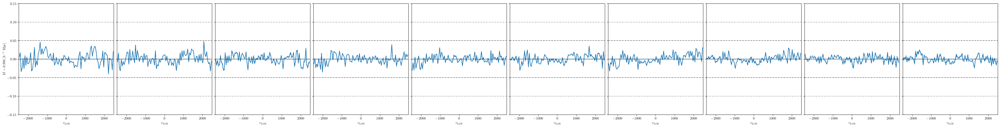

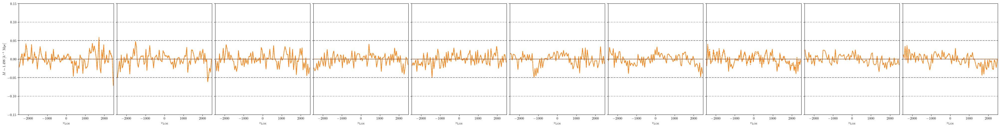

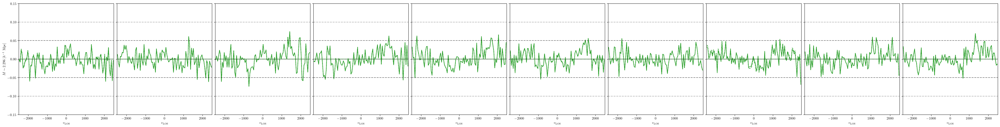

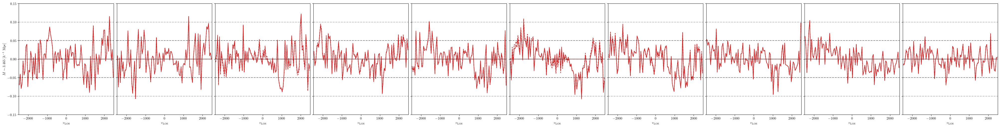

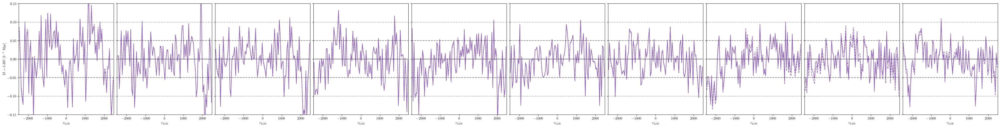

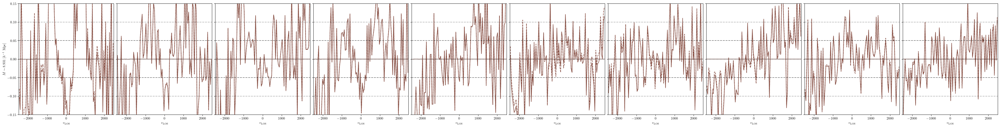

In [215]:
# do these fits look better?


for k in range(len(Mvirs)):
    fig, ax = plt.subplots(1, len(r_cens), figsize=(40, 5), layout='constrained', sharex=True, sharey=True)
    for i in range(len(r_cens)):
        index = i + k*len(r_cens)

        hist, bins, _ = ax[i].hist(vphyslos[index], bins=vedges, density=True, histtype='step', color=f'C{k}')
        model_ini = P_R(vcens, r_cens[i], Mvirs[k], res.x) #P[:, i, k]
        model_out = P_R(vcens, r_cens[i], pars[k, i, 0]*1e14, res.x)

        ax[i].plot(vcens, (hist-model_ini)/model_ini, c=f'C{k}')
        ax[i].plot(vcens, (hist-model_out)/model_out, c=f'C{k}', ls='--') 
        ax[i].axhline(0, ls=':', color='k')
        ax[i].axhline(0.05, ls='--', color='k', alpha=0.5)
        ax[i].axhline(-0.05, ls='--', color='k', alpha=0.5)
        ax[i].axhline(0.1, ls='--', color='k', alpha=0.3)
        ax[i].axhline(-0.1, ls='--', color='k', alpha=0.3)

        ax[i].set_xlabel(r"$v_{\rm LOS}$")
        #ax[i].set_yticks([])
        ax[i].set_ylim((-0.15, 0.15))
        ax[i].margins(x=0)
        MAPDS = [np.mean(np.abs((hist-model_ini)/model_ini)), np.mean(np.abs((hist-model_out)/model_out))]
        labs = ["in", "out"]
        print("Min MAPD: ", labs[np.argmin(MAPDS)])

    ax[0].set_ylabel(rf"$M\sim {(Mvirs[k]/1e14):.3f} \ [h^{{-1}}$ Mpc]")

In [23]:
clive_init

array([ 1.10271764e+02,  6.17810211e-01,  7.59902171e-01, -9.25929884e-02,
        5.67728617e+02,  3.64409047e-01,  7.05232031e-01, -4.75770584e-01])

In [25]:
clive_init[4:]

array([ 5.67728617e+02,  3.64409047e-01,  7.05232031e-01, -4.75770584e-01])

In [26]:
len(Bounds)

8

In [89]:
# Fit clive model while fixing v_r parameters:

def poisson_llh_vec_fixed_vr(pars):
    """
    Nv_R shape assumed: (Nv, NR, NM)
    """
    # (Nv, NR, NM)
    P   = P_R_vec(vcens, r_cens, Mvirs, np.concatenate(([vrm_pars[0, 0], vrm_pars[0, 1], vrm_pars[1, 0], vrm_pars[1, 1]], pars))) # < 1 sec / eval
    dv  = np.diff(vcens)[0]
    # total counts per (R, M): (1, NR, NM)
    N   = Nv_R.sum(axis=-1, keepdims=True)
    #print(P.shape, N.shape, dv.shape)
    lam = P.T * dv * N
    log_likelihood = np.sum(scipy.stats.poisson.logpmf(k=Nv_R, mu=lam))
    return log_likelihood

fres = scipy.optimize.minimize(lambda p: -poisson_llh_vec_fixed_vr(p), clive_init[4:], bounds=Bounds[4:], method='nelder-mead')
print("Initial: ", clive_init[4:]) 
print("MLE: ", fres.x)

Initial:  [ 5.67822759e+02  3.67195468e-01  6.89410374e-01 -4.52537338e-01]
MLE:  [ 5.30823283e+02  3.62790624e-01  5.60294087e-01 -6.92776442e-01]


In [90]:
fix_soln = np.concatenate(([vrm_pars[0, 0], vrm_pars[0, 1], vrm_pars[1, 0], vrm_pars[1, 1]], fres.x))

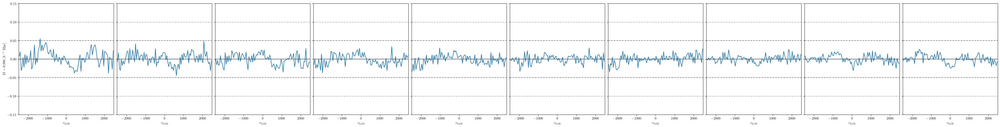

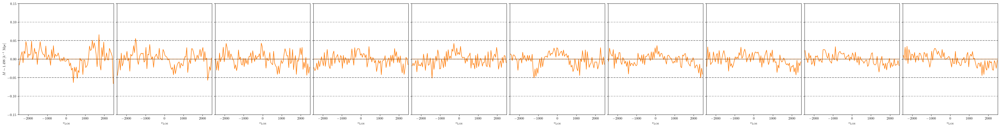

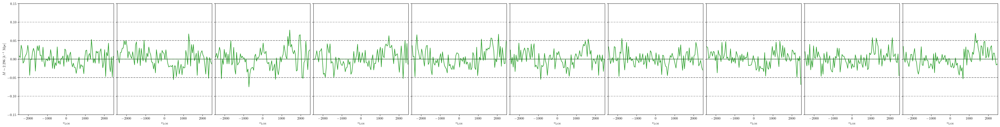

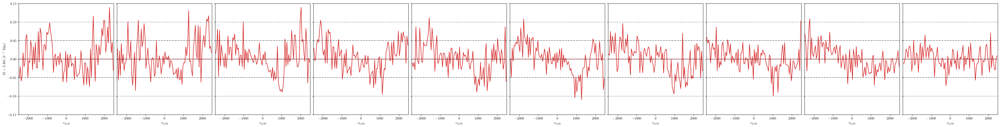

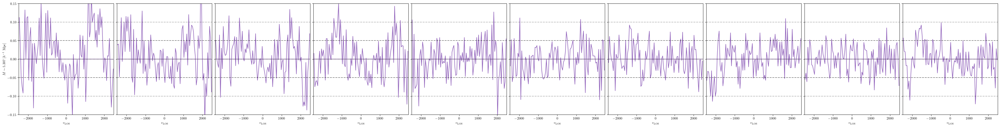

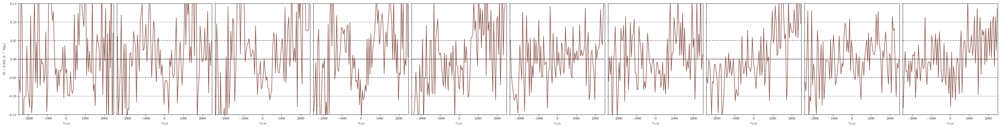

In [33]:
P = P_R_vec(vcens, r_cens, Mvirs, fix_soln)

for k in range(len(Mvirs)):
    fig, ax = plt.subplots(1, len(r_cens), figsize=(40, 5), layout='constrained', sharex=True, sharey=True)
    for i in range(len(r_cens)):
        index = i + k*len(r_cens)

        hist, bins, _ = ax[i].hist(vphyslos[index], bins=vedges, density=True, histtype='step', color=f'C{k}')
        model = P[:, i, k]

        ax[i].plot(vcens, (hist-model)/model, c=f'C{k}') 
        ax[i].axhline(0, ls=':', color='k')
        ax[i].axhline(0.05, ls='--', color='k', alpha=0.5)
        ax[i].axhline(-0.05, ls='--', color='k', alpha=0.5)
        ax[i].axhline(0.1, ls='--', color='k', alpha=0.3)
        ax[i].axhline(-0.1, ls='--', color='k', alpha=0.3)

        ax[i].set_xlabel(r"$v_{\rm LOS}$")
        #ax[i].set_yticks([])
        ax[i].set_ylim((-0.15, 0.15))
        ax[i].margins(x=0)
    ax[0].set_ylabel(rf"$M\sim {(Mvirs[k]/1e14):.3f} \ [h^{{-1}}$ Mpc]")

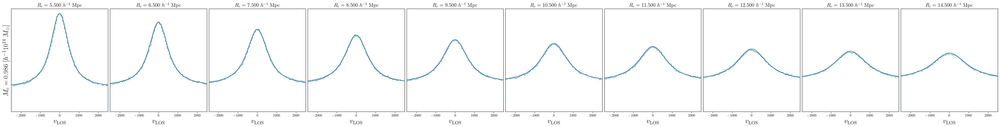

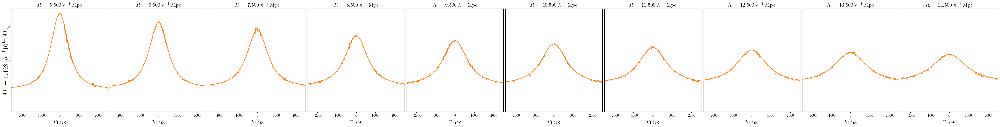

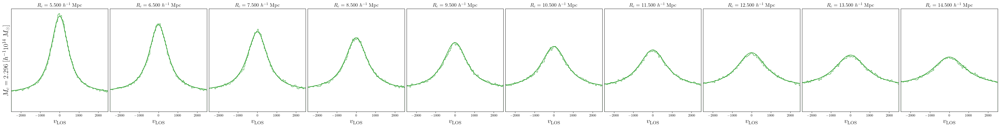

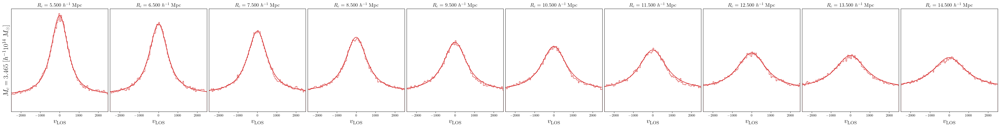

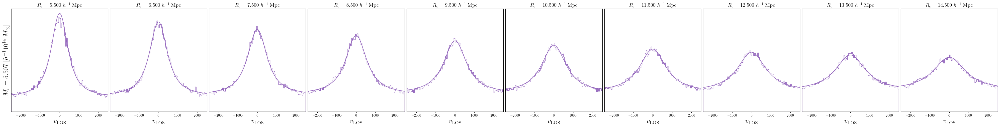

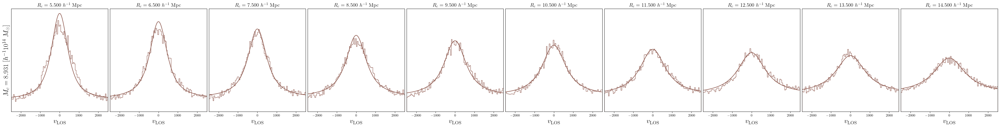

In [91]:
for k in range(len(Mvirs)):
    fig, ax = plt.subplots(1, len(r_cens), figsize=(40, 5), layout='constrained', sharex=True, sharey=True)
    for i in range(len(r_cens)):
        index = i + k*len(r_cens)

        hist, bins, _ = ax[i].hist(vphyslos[index], bins=vedges, density=True, histtype='step', color=f'C{k}')

        ax[i].plot(vcens, P[:, i, k], c=f'C{k}') 
        ax[i].set_xlabel(r"$v_{\rm LOS}$", fontsize=20)
        ax[i].set_title(rf"$R_c = {r_cens[i]:.3f} \ h^{{-1}}$ Mpc", fontsize=15)
        ax[i].set_yticks([])
        ax[i].margins(x=0)
    ax[0].set_ylabel(rf"$M_c = {(Mvirs[k]/1e14):.3f} \ [h^{{-1}} 10^{{14}} \ M_\odot]$", fontsize=20)

Text(0.5, 0, '$R$')

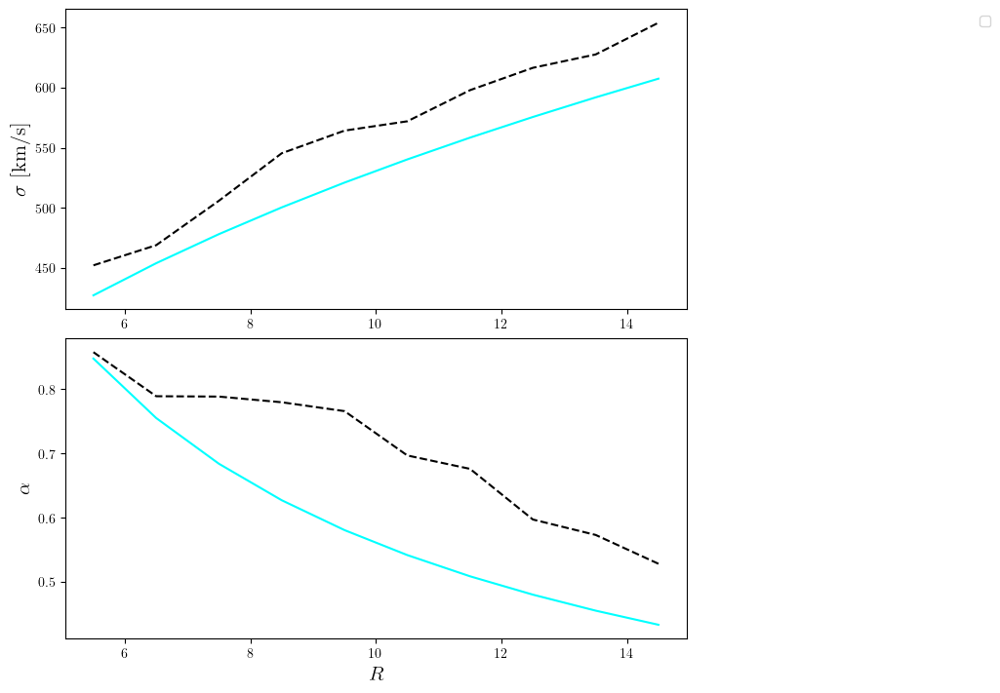

In [92]:
fig, ax = plt.subplots(2, 1, figsize=(10, 7), layout='constrained')

#names = [r"$\lambda$", r"$\sigma$ [km/s]", r"$\alpha$", r"dof"]
names = [r"$\sigma$ [km/s]", r"$\alpha$"]

MLE_sal = [[fix_soln[4], fix_soln[5]], [fix_soln[6], fix_soln[7]]]


for j in range(2):
    #for k in range(len(Mvirs)):
    #    ax[j].errorbar(r_cens, PvR_pars[k, :, j], PvR_errs[k, :, j], fmt='o-', c=f"C{k}", capsize=3,  label=rf"$M_c = {(Mvirs[k]/1e14):.3f} \ [h^{{-1}} 10^{{14}} \ M_\odot]$")
    
    ax[j].plot(r_cens, np.mean(PvR_pars[:, :, j], axis=0), c='k', ls='--')
    

    ax[j].plot(r_cens, plaw(r_cens/10, MLE_sal[j][0], MLE_sal[j][1]), c='cyan')

    ax[j].set_ylabel(names[j], fontsize=15)

ax[0].legend(loc='upper right', bbox_to_anchor=(1.5, 1))
ax[-1].set_xlabel(r"$R$", fontsize=15)

In [93]:
# how well does this fit masses?

def RG_llh_ind(pars, data, r_ind):
    M, s = pars 

    M_p = 1e14

    dv = (vedges[-1]-vedges[0])/(len(vedges)-1)

    N_avg = np.sum(data) * P_R(vcens, r_cens[r_ind], M*M_p, fix_soln) * dv

    sigmasq = N_avg + s**2 * N_avg**2

    chisq = ((data) - N_avg)**2 / sigmasq  

    return - 0.5 * np.sum(chisq + np.log(sigmasq))

def G_llh_ind(pars, data, r_ind):
    M = pars 

    M_p = 1e14

    dv = (vedges[-1]-vedges[0])/(len(vedges)-1)

    N_avg = np.sum(data) * P_R(vcens, r_cens[r_ind], M*M_p, fix_soln) * dv

    sigmasq = N_avg 

    chisq = ((data) - N_avg)**2 / sigmasq  

    return - 0.5 * np.sum(chisq + np.log(sigmasq))


In [94]:
Nv_R_mod = np.zeros(Nv_R.shape)

for k in range(len(Mvirs)):
    for i in tqdm(range(len(r_cens))):
        N = int(np.sum(Nv_R[k, i]))

        model_samples = sample_P_R_fast(r_cens[i], Mvirs[k], fix_soln, N, vlos_halfwidth=2500, n_vlos=len(vcens))

        hist, _ = np.histogram(model_samples, bins=vedges, density=False)

        Nv_R_mod[k, i] = hist 

100%|██████████| 10/10 [00:01<00:00,  9.38it/s]


In [95]:
# individual bins, first model samples
pars = np.zeros((len(Mvirs), len(r_cens), 2))
#errs = np.zeros((len(Mvirs), len(r_cens), 2))


for k in range(len(Mvirs)):
    for i in range(len(r_cens)):
        p_init = [Mvirs[k]/1e14, 0.01]

        soln = scipy.optimize.minimize(lambda p: -RG_llh_ind(p, Nv_R_mod[k, i], i), p_init, 
                                    #bounds = [(0.5, 12), (-0.1, 0.1)],#, (0, np.inf), (0, np.inf)], 
                                    method='nelder-mead', 
                                    )
        print("Initial: ",p_init) 
        print("MLE: ", soln.x) 
        print(soln.message)

        pars[k, i] = soln.x

Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.02041516 0.02869812]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.00577685 0.02192725]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.02868938 0.01718736]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.03358591 0.01570593]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.04565157 0.01496744]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.02096317 0.01381979]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.01586588 0.01218377]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.03575506 0.01261861]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.09520711 0.01008766]
Optimization terminated successfully.
Initial:  [np.float

(np.float64(0.8000202269281375), np.float64(16.000000000000007))

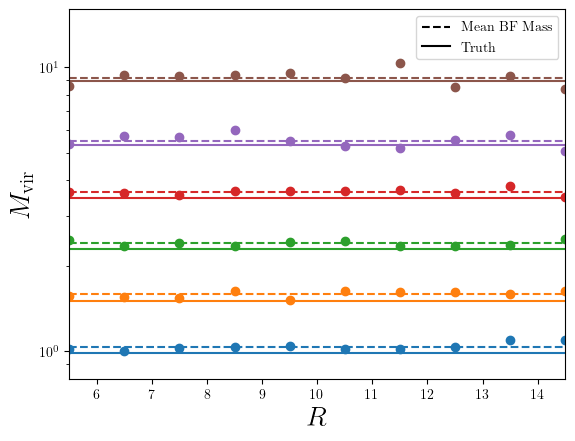

In [96]:
from matplotlib.lines import Line2D


for k in range(len(Mvirs)):
    plt.scatter(r_cens, pars[k, :, 0])
    #plt.errorbar(r_cens, pars[k, :, 0], np.sqrt(0.5*errs[k, :, 0]), fmt='o')
    plt.axhline(Mvirs[k]/1e14, c=f'C{str(k)}', ls='-')
    plt.axhline(np.mean(pars[k, :, 0]), c=f'C{str(k)}', ls='--')

    #plt.axhline(mbins[k+1]/1e14, c=f'k', ls=':')




marker_1 = Line2D(
    [0], [0],
    color='k',          
    marker='none',
    linestyle='--',
    label='Mean BF Mass', 

)

marker_2 = Line2D(
    [0], [0],
    color='k',          
    marker='none',
    linestyle='-',
    label='Truth'
)

plt.xlabel(r'$R$', fontsize=20)
plt.ylabel(r'$M_{\rm vir}$', fontsize=20)
plt.yscale('log')
plt.margins(x=0)
plt.legend(handles=[marker_1, marker_2], fontsize=10)
plt.ylim((mbins[0]/1e14, mbins[-1]/1e14))

Text(0, 0.5, '$\\sigma_{\\rm inht}$')

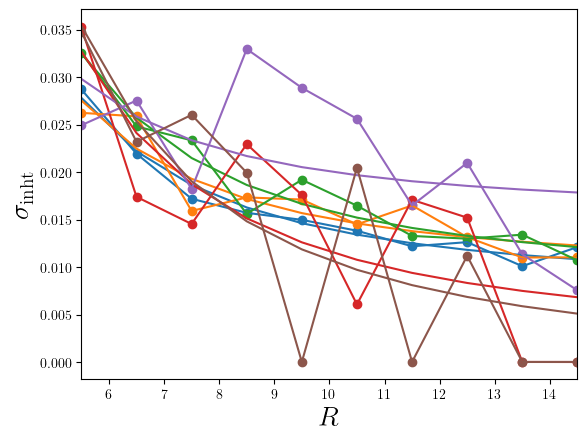

In [97]:
inht_pars = np.zeros((len(Mvirs), 2))
inht_errs = np.zeros((len(Mvirs), 2))

for k in range(6):
    plt.scatter(r_cens, pars[k, :, 1], )
    plt.plot(r_cens, pars[k, :, 1])
    #plt.errorbar(r_cens, pars[k, :, 1], err_mass_ind_RG[k, :, 1], fmt='o')

    p, c = curve_fit(lambda x, a, c: plawc(x, a, b=-2, c=c), r_cens/10, pars[k, :, 1],bounds=((0, 0), (10, 10)), maxfev=10_000)
    plt.plot(r_cens, plawc(r_cens/10, p[0], -2, p[1]), c=f'C{str(k)}')
    # p, c = curve_fit(var_diff, r_cens/10, pars[k, :, 1], bounds=((0, 0, 0), (0.01, 2, 0.002)) , maxfev=10_000)
    # plt.plot(r_cens, var_diff(r_cens/10, p[0], p[1], p[2]), c=f'C{str(k)}')
    
    inht_pars[k, :] = p
    inht_errs[k, :] = np.sqrt(np.diag(c))

plt.margins(x=0)
#plt.ylim((0, 0.12))
plt.xlabel(r'$R$', fontsize=20)
plt.ylabel(r'$\sigma_{\rm inht}$', fontsize=20)

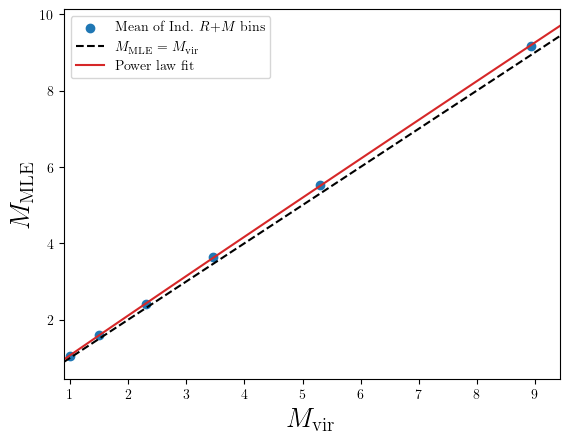

In [98]:
ms = np.linspace(Mvirs[0]/1e14-0.1, Mvirs[-1]/1e14+0.5, 100)

mvirs = Mvirs/1e14

p, c = curve_fit(plaw, mvirs, np.mean(pars[:, :, 0], axis=-1))
plt.scatter(mvirs, np.mean(pars[:, :, 0], axis=-1), label='Mean of Ind. $R$+$M$ bins')
plt.plot(ms, line(ms, 1, 0), c='k', ls='--', label=r'$M_{\rm MLE} = M_{\rm vir}$')
plt.plot(ms, plaw(ms, p[0], p[1]), c='C3', ls='-', label='Power law fit')
plt.margins(x=0)
plt.ylabel(r'$M_{\rm MLE}$', fontsize=20)
plt.xlabel(r'$M_{\rm vir}$', fontsize=20)
plt.legend(fontsize=10)

4.599154222464894


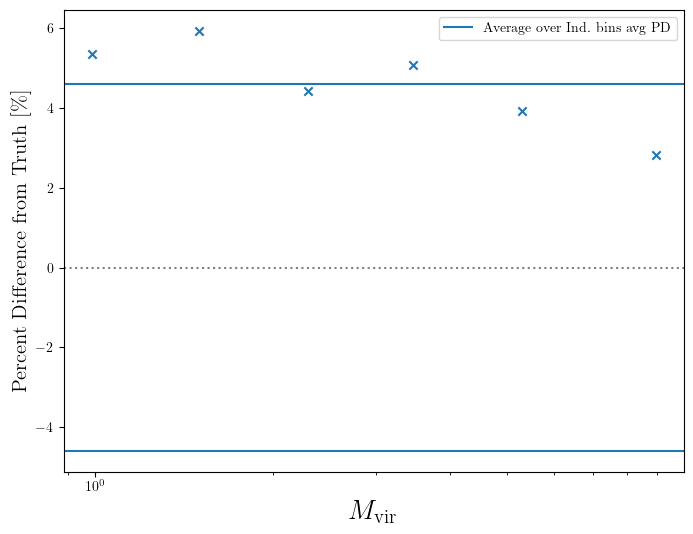

In [99]:
mvirs = Mvirs/1e14

fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(mvirs, ((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs)*100, marker='x')
ax.axhline(np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100, label=r'Average over Ind. bins avg PD') 
ax.axhline(-np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100 ) 


ax.axhline(0.0, c='k', ls=':', alpha=0.5)
ax.set_xlabel(r"$M_{\rm vir}$", fontsize=20) 
ax.set_ylabel(r"Percent Difference from Truth $[\%]$", fontsize=15) 
ax.set_xscale('log')
#ax.set_ylim((-5, 5))
#ax.set_title(titles[j], fontsize=25)
ax.legend()

print(np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100)

0.8658741826234078


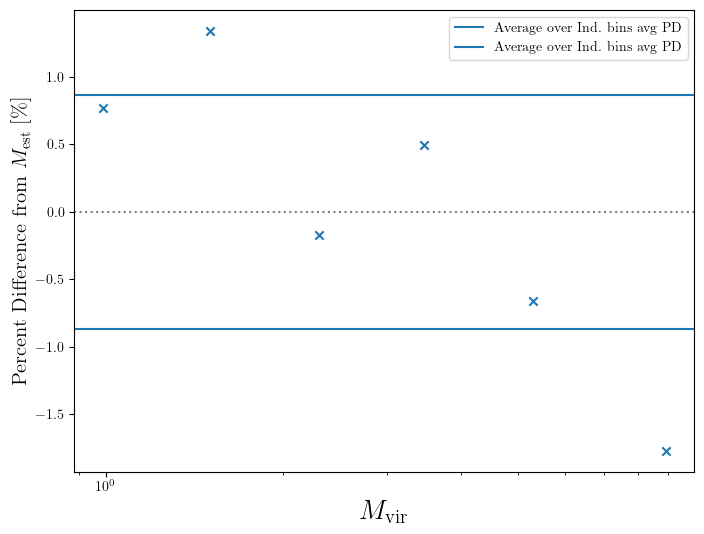

In [100]:
# interesting.. what if we correct the estimate ?

fig, ax = plt.subplots(figsize=(8,6))

MAPD = np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100

ax.scatter(mvirs, ((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs)*100 - MAPD, marker='x')
ax.axhline(np.mean(np.abs(((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs)*100 - MAPD)), label=r'Average over Ind. bins avg PD') 
ax.axhline(-np.mean(np.abs(((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs)*100 - MAPD)), label=r'Average over Ind. bins avg PD') 



ax.axhline(0.0, c='k', ls=':', alpha=0.5)
ax.set_xlabel(r"$M_{\rm vir}$", fontsize=20) 
ax.set_ylabel(r"Percent Difference from $M_{\rm est}$ $[\%]$", fontsize=15) 
ax.set_xscale('log')
#ax.set_ylim((-5, 5))
#ax.set_title(titles[j], fontsize=25)
ax.legend()

print(np.mean(np.abs(((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs)*100 - MAPD)))

In [52]:
# individual bins, now on sim data
pars = np.zeros((len(Mvirs), len(r_cens), 2))
#errs = np.zeros((len(Mvirs), len(r_cens), 2))


for k in range(len(Mvirs)):
    for i in range(len(r_cens)):
        p_init = [Mvirs[k]/1e14, 0.01]

        soln = scipy.optimize.minimize(lambda p: -RG_llh_ind(p, Nv_R[k, i], i), p_init, 
                                    #bounds = [(0.5, 12), (-0.1, 0.1)],#, (0, np.inf), (0, np.inf)], 
                                    method='nelder-mead', 
                                    )
        print("Initial: ",p_init) 
        print("MLE: ", soln.x) 
        print(soln.message)

        pars[k, i] = soln.x

Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.91727358 0.01443605]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.95333542 0.01115393]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.03252015 0.0096158 ]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.06578545 0.00754904]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.08301486 0.00417478]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.00613145 0.00450787]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.99443893 0.00616648]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.92382193 0.00176298]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.97736775 0.00668194]
Optimization terminated successfully.
Initial:  [np.float

(np.float64(0.8000202269281375), np.float64(16.000000000000007))

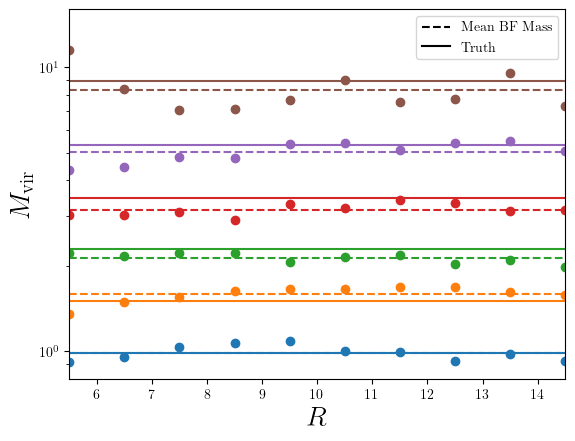

In [53]:
from matplotlib.lines import Line2D


for k in range(len(Mvirs)):
    plt.scatter(r_cens, pars[k, :, 0])
    #plt.errorbar(r_cens, pars[k, :, 0], np.sqrt(0.5*errs[k, :, 0]), fmt='o')
    plt.axhline(Mvirs[k]/1e14, c=f'C{str(k)}', ls='-')
    plt.axhline(np.mean(pars[k, :, 0]), c=f'C{str(k)}', ls='--')

    #plt.axhline(mbins[k+1]/1e14, c=f'k', ls=':')




marker_1 = Line2D(
    [0], [0],
    color='k',          
    marker='none',
    linestyle='--',
    label='Mean BF Mass', 

)

marker_2 = Line2D(
    [0], [0],
    color='k',          
    marker='none',
    linestyle='-',
    label='Truth'
)

plt.xlabel(r'$R$', fontsize=20)
plt.ylabel(r'$M_{\rm vir}$', fontsize=20)
plt.yscale('log')
plt.margins(x=0)
plt.legend(handles=[marker_1, marker_2], fontsize=10)
plt.ylim((mbins[0]/1e14, mbins[-1]/1e14))

Text(0, 0.5, '$\\sigma_{\\rm inht}$')

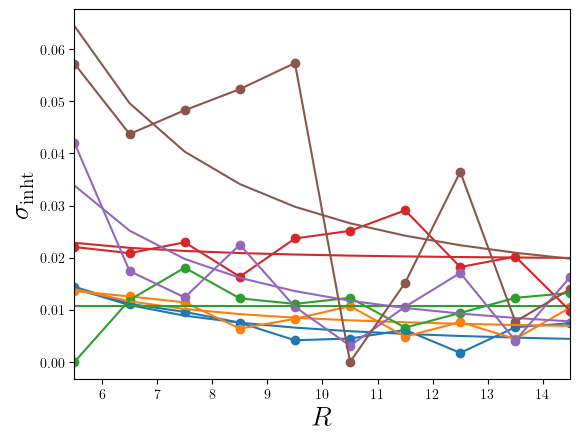

In [54]:
inht_pars = np.zeros((len(Mvirs), 2))
inht_errs = np.zeros((len(Mvirs), 2))

for k in range(6):
    plt.scatter(r_cens, pars[k, :, 1], )
    plt.plot(r_cens, pars[k, :, 1])
    #plt.errorbar(r_cens, pars[k, :, 1], err_mass_ind_RG[k, :, 1], fmt='o')

    p, c = curve_fit(lambda x, a, c: plawc(x, a, b=-2, c=c), r_cens/10, pars[k, :, 1],bounds=((0, 0), (10, 10)), maxfev=10_000)
    plt.plot(r_cens, plawc(r_cens/10, p[0], -2, p[1]), c=f'C{str(k)}')
    # p, c = curve_fit(var_diff, r_cens/10, pars[k, :, 1], bounds=((0, 0, 0), (0.01, 2, 0.002)) , maxfev=10_000)
    # plt.plot(r_cens, var_diff(r_cens/10, p[0], p[1], p[2]), c=f'C{str(k)}')
    
    inht_pars[k, :] = p
    inht_errs[k, :] = np.sqrt(np.diag(c))

plt.margins(x=0)
#plt.ylim((0, 0.12))
plt.xlabel(r'$R$', fontsize=20)
plt.ylabel(r'$\sigma_{\rm inht}$', fontsize=20)

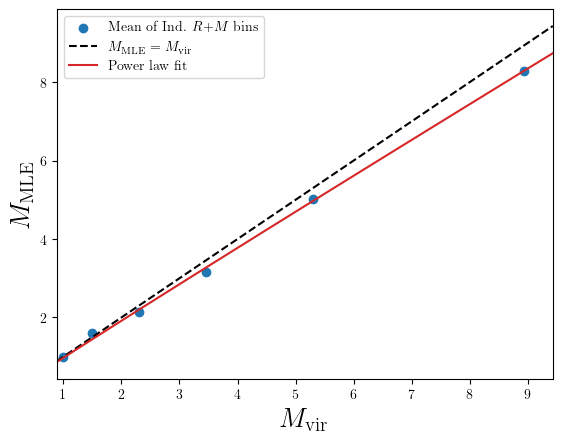

In [55]:
ms = np.linspace(Mvirs[0]/1e14-0.1, Mvirs[-1]/1e14+0.5, 100)

mvirs = Mvirs/1e14

p, c = curve_fit(plaw, mvirs, np.mean(pars[:, :, 0], axis=-1))
plt.scatter(mvirs, np.mean(pars[:, :, 0], axis=-1), label='Mean of Ind. $R$+$M$ bins')
plt.plot(ms, line(ms, 1, 0), c='k', ls='--', label=r'$M_{\rm MLE} = M_{\rm vir}$')
plt.plot(ms, plaw(ms, p[0], p[1]), c='C3', ls='-', label='Power law fit')
plt.margins(x=0)
plt.ylabel(r'$M_{\rm MLE}$', fontsize=20)
plt.xlabel(r'$M_{\rm vir}$', fontsize=20)
plt.legend(fontsize=10)

5.828913640251396


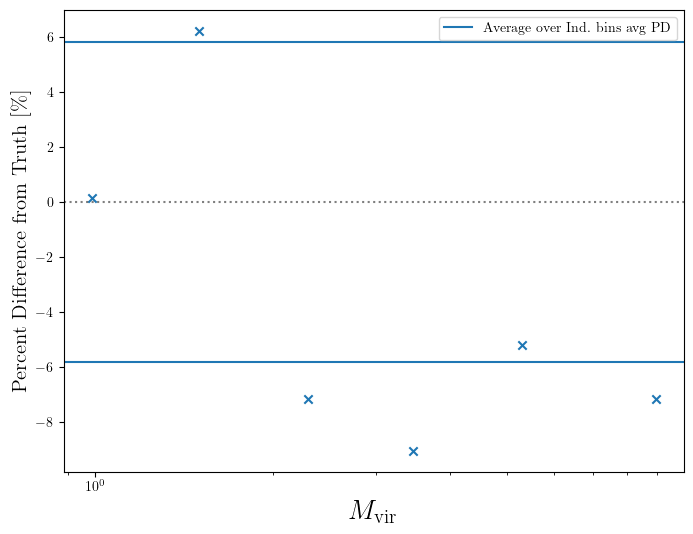

In [56]:
mvirs = Mvirs/1e14

fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(mvirs, ((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs)*100, marker='x')
ax.axhline(np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100, label=r'Average over Ind. bins avg PD') 
ax.axhline(-np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100 ) 


ax.axhline(0.0, c='k', ls=':', alpha=0.5)
ax.set_xlabel(r"$M_{\rm vir}$", fontsize=20) 
ax.set_ylabel(r"Percent Difference from Truth $[\%]$", fontsize=15) 
ax.set_xscale('log')
#ax.set_ylim((-5, 5))
#ax.set_title(titles[j], fontsize=25)
ax.legend()

print(np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100)

5.828913640251396


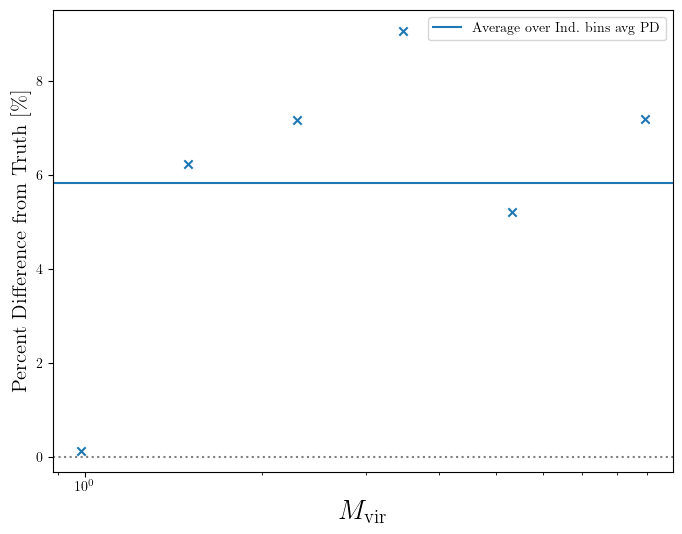

In [57]:
mvirs = Mvirs/1e14

fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(mvirs, np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs)*100, marker='x')
ax.axhline(np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100, label=r'Average over Ind. bins avg PD') 
#ax.axhline(-np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100 ) 


ax.axhline(0.0, c='k', ls=':', alpha=0.5)
ax.set_xlabel(r"$M_{\rm vir}$", fontsize=20) 
ax.set_ylabel(r"Percent Difference from Truth $[\%]$", fontsize=15) 
ax.set_xscale('log')
#ax.set_ylim((-5, 5))
#ax.set_title(titles[j], fontsize=25)
ax.legend()

print(np.mean(np.abs((np.mean(pars[:, :, 0], axis=1)-mvirs)/mvirs))*100)

In [60]:
pars[:, :, 0].shape

(6, 10)

3.5154081631690244
1.0776551390529483


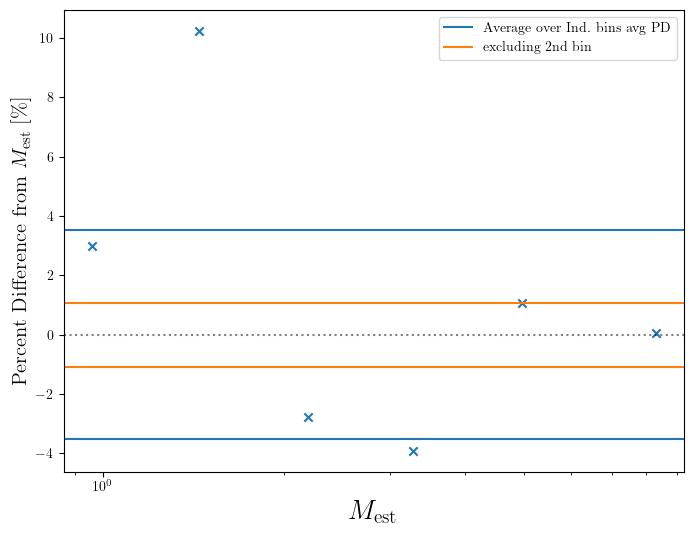

In [63]:
# what if we correct the estimate ?

fig, ax = plt.subplots(figsize=(8,6))

PD = ((np.mean(pars[:, :, 0], axis=1)-plaw(Mvirs/1e14, p[0], p[1]))/plaw(Mvirs/1e14, p[0], p[1]))*100

MAPD = np.mean(np.abs(PD))

ax.scatter(plaw(Mvirs/1e14, p[0], p[1]), PD, marker='x')
ax.axhline(np.mean(np.abs(PD)), label=r'Average over Ind. bins avg PD') 
ax.axhline(-np.mean(np.abs(PD)), ) 

ax.axhline(np.mean(np.abs(PD[~1])), label=r'excluding 2nd bin', c='C1') 
ax.axhline(-np.mean(np.abs(PD[~1])), c='C1') 


ax.axhline(0.0, c='k', ls=':', alpha=0.5)
ax.set_xlabel(r"$M_{\rm est}$", fontsize=20) 
ax.set_ylabel(r"Percent Difference from $M_{\rm est}$ $[\%]$", fontsize=15) 
ax.set_xscale('log')
#ax.set_ylim((-5, 5))
#ax.set_title(titles[j], fontsize=25)
ax.legend()

print(np.mean(np.abs(PD)))

print(np.mean(np.abs(PD[~1])))